In [17]:
# This code is kinda a mess, the first few blocks are designed to create the classification that is used
# to make the interactive plot and then to create the .png images of different viewpoint's kinematic maps,
# which are also used to create the interactive figure

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, precision_score
from sklearn.model_selection import train_test_split
import seaborn as sns
import itertools
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from scipy.signal import argrelextrema
import sklearn.metrics as metrics
import os
from sklearn.preprocessing import LabelEncoder

def locate_min(a):
        smallest = min(a)
        return smallest, [index for index, element in enumerate(a) 
                      if smallest == element]
def gini_m20(row):
    return row['Gini']*row['M20']
def gini_C(row):
    return row['Gini']*row['C']
def gini_A(row):
    return row['Gini']*row['A']
def gini_S(row):
    return row['Gini']*row['S']
def gini_n(row):
    return row['Gini']*row['Sersic n']
def gini_A_S(row):
    return row['Gini']*row['A_s']

def M20_C(row):
    return row['M20']*row['C']
def M20_A(row):
    return row['M20']*row['A']
def M20_S(row):
    return row['M20']*row['S']
def M20_n(row):
    return row['M20']*row['Sersic n']
def M20_A_S(row):
    return row['M20']*row['A_s']

def C_A(row):
    return row['C']*row['A']
def C_S(row):
    return row['C']*row['S']
def C_n(row):
    return row['C']*row['Sersic n']
def C_A_S(row):
    return row['C']*row['A_s']


def A_S(row):
    return row['A']*row['S']
def A_n(row):
    return row['A']*row['Sersic n']
def A_A_S(row):
    return row['A']*row['A_s']

def S_n(row):
    return row['S']*row['Sersic n']
def S_A_S(row):
    return row['S']*row['A_s']

def n_A_S(row):
    return row['Sersic n']*row['A_s']




import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, precision_score
from sklearn.model_selection import train_test_split
import seaborn as sns
import itertools
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from scipy.signal import argrelextrema
import sklearn.metrics as metrics
  



def mosthighlycorrelated(mydataframe, numtoreport):
    # find the correlations
    cormatrix = mydataframe.corr()
    # set the correlations on the diagonal or lower triangle to zero,
    # so they will not be reported as the highest ones:
    cormatrix *= np.tri(*cormatrix.values.shape, k=-1).T
    # find the top n correlations
    cormatrix = cormatrix.stack()
    cormatrix = cormatrix.reindex(cormatrix.abs().sort_values(ascending=False).index).reset_index()
    # assign human-friendly names
    cormatrix.columns = ["FirstVariable", "SecondVariable", "Correlation"]
    return cormatrix.head(numtoreport)

feature_dict = {i:label for i,label in zip(
                range(14),
                  ('Counter',
                  'Image',
                  'class label',
                  'Myr',
                  'Viewpoint',
                '# Bulges',
                   'Sep',
                   'Flux Ratio',
                  'Gini',
                  'M20',
                  'C',
                  'A',
                  'S',
                  'Sersic n',
                  'A_s'))}
def group_consecutives(vals, step=1):
    """Return list of consecutive lists of numbers from vals (number list)."""
    run = []
    result = [run]
    expect = None
    for v in vals:
        if (v == expect) or (expect is None):
            run.append(v)
        else:
            run = [v]
            result.append(run)
        expect = v + step
    return result


In [95]:
# Right now I'm just running the classification for one simulation
# but the eventual goal is to create some sort of loop that will
# produce different tabs in the interactive plot for each different
# simulation (I think this won't be too hard)

list_runs=['major_all','minor_all','fg3_m12','fg3_m13','fg1_m13','fg3_m15','fg3_m10']
colors=["#3E1929","#643a71", "#845A6D","#B0DAF1",
        "#6E75A8","#8b5fbf","#d183c9"]
names=['Major Mergers','Minor Mergers','q0.5_fg0.3','q0.333_fg0.3','q0.333_fg0.1','q0.2_fg0.3_BT0.2']
#643A71
priors_list=[[0.9,0.1],[0.7,0.3],[0.9,0.1],[0.9,0.1],[0.9,0.1],[0.7,0.3],[0.7,0.3]]
vers_list=['','','','','','','']
images=''




plt.clf()
missclass_list=[]


LDA_time=[]
myr_total=[]


num_comps_list=[]
missclass_list_1=[]
missclass_list_1_e=[]
min_comps_list=[]
min_A_list=[]

dPA_means_all=[]
va_means_all=[]
color_means_all=[]
sa_means_all=[]
resids_means_all=[]
lambdar_means_all=[]
epsilon_means_all=[]

A2_means_all=[]
deltapos_means_all=[]
deltapos2_means_all=[]

dPA_means_all_non=[]
va_means_all_non=[]
color_means_all_non=[]
sa_means_all_non=[]
resids_means_all_non=[]
lambdar_means_all_non=[]
epsilon_means_all_non=[]

A2_means_all_non=[]
deltapos_means_all_non=[]
deltapos2_means_all_non=[]


# Things to save for the purpose of the interactive part:
significant_coef_list=[]
significant_std_list=[]
significant_term_list=[]

myr_list_list=[]
myr_list_sorted_left_list=[]
myr_list_sorted_right_list=[]

myr_here_list=[]

input_1_means_list=[]
input_2_means_list=[]
input_3_means_list=[]

input_1_means_list_non=[]
input_2_means_list_non=[]
input_3_means_list_non=[]

list_inter_list=[]
new_min_index_list=[]

new_means_list=[]
std_list=[]

mean_non_list=[]

coalescence_list=[]
early_list=[]

new_means_non_left_list=[]
std_non_left_list=[]

new_means_non_right_list=[]
std_non_right_list=[]

myr_here_non_left_list=[]
myr_here_non_right_list=[]

for i in range(len(list_runs)):
    #i=i+2
    add_on=list_runs[i]
    
    vers = vers_list[i]
    
    
        
    run=list_runs[i]
    print(os.getcwd())
    
    df = pd.io.parsers.read_table(
        filepath_or_buffer='../images/LDA_'+str(run)+'_post_psf_fix.txt',#'_view_all.txt',#filepath_or_buffer='LDA_img_ratio_'+str(run)+'_early_late_all_things.txt',#'_view_all.txt',
        header=[0],
        sep='\t'
        )
    
    
    #df.columns = [l for i,l in sorted(feature_dict.items())] + ['Shape Asymmetry']

    df.dropna(how="all", inplace=True) # to drop the empty line at file-end


    for j in range(len(df)):
        if df[['Myr']].values[j][0]<0.39:#df[['Myr']].values[i][0]
            df.set_value(j,'class label',0)
        if add_on[:7]=='fg3_m12' and (df[['Myr']].values[j][0]-2.15) > 0.5:#0.39+0.1:#was 0.39
            df.set_value(j,'class label',0)
        if add_on[:7]=='fg1_m13' and (df[['Myr']].values[j][0]-2.74) > 0.5:#2.74-2.25+2.74:#was 0.39
            df.set_value(j,'class label',0)
        if add_on[:7]=='fg3_m13' and (df[['Myr']].values[j][0]-2.59) > 0.5:#2.64+0.5
            df.set_value(j,'class label',0)
        if add_on[:7]=='fg3_m15' and (df[['Myr']].values[j][0]-3.72) > 0.5:
            df.set_value(j,'class label',0)
        if add_on[:9]=='fg3_m1_10' and (df[['Myr']].values[j][0]-9.17) > 0.5:
            df.set_value(j,'class label',0)
        if add_on[:9]=='major_all':
            #then sort by image name
            if df[['Image']].values[j][0][:4]=='q0.5' and (df[['Myr']].values[j][0]-2.15) > 0.5:#q0.5_fg0.3
                df.set_value(j,'class label',0)
            if df[['Image']].values[j][0][:12]=='q0.333_fg0.1' and (df[['Myr']].values[j][0]-2.59) > 0.5:
                df.set_value(j,'class label',0)
            if df[['Image']].values[j][0][:12]=='q0.333_fg0.3' and (df[['Myr']].values[j][0]-2.74) > 0.5:
                df.set_value(j,'class label',0)
        if add_on[:9]=='minor_all':
            #then sort by image name
            if df[['Image']].values[j][0][:7]=='fg3_m15' and (df[['Myr']].values[j][0]-3.72) > 0.5:
                df.set_value(j,'class label',0)
            if df[['Image']].values[j][0][:7]=='fg3_m10' and (df[['Myr']].values[j][0]-9.17) > 0.5:
                df.set_value(j,'class label',0)
            
      

    myr=[]
    myr_non=[]
    for j in range(len(df)):
        if df[['class label']].values[j][0]==0.0 or df[['class label']].values[j][0]==0:
            myr_non.append(df[['Myr']].values[j][0])
        else:
            myr.append(df[['Myr']].values[j][0])
            #myr_name.append(df[['Image']].values[j][0][:12])
            #if df[['Myr']].values[j][0] > 2.65:
            #    print('image', df[['Image']].values[j][0][:12], 'myr', df[['Myr']].values[j][0])

    myr_non=sorted(list(set(myr_non)))
    myr=sorted(list(set(myr)))


    print('myr_non', myr_non)
    print('myr', myr)
    
    
    
    
    
    
    
    df.dropna(inplace=True) # to drop the empty line at file-end
    

    
    
    df['Gini*M20'] = df.apply(gini_m20,axis=1)
    df['Gini*C'] = df.apply(gini_C,axis=1)
    df['Gini*A'] = df.apply(gini_A,axis=1)
    df['Gini*S'] = df.apply(gini_S,axis=1)
    df['Gini*n'] = df.apply(gini_n,axis=1)
    df['Gini*A_S'] = df.apply(gini_A_S,axis=1)

    df['M20*C'] = df.apply(M20_C,axis=1)
    df['M20*A'] = df.apply(M20_A,axis=1)
    df['M20*S'] = df.apply(M20_S,axis=1)
    df['M20*n'] = df.apply(M20_n,axis=1)
    df['M20*A_S'] = df.apply(M20_A_S,axis=1)

    df['C*A'] = df.apply(C_A,axis=1)
    df['C*S'] = df.apply(C_S,axis=1)
    df['C*n'] = df.apply(C_n,axis=1)
    df['C*A_S'] = df.apply(C_A_S,axis=1)

    df['A*S'] = df.apply(A_S,axis=1)
    df['A*n'] = df.apply(A_n,axis=1)
    df['A*A_S'] = df.apply(A_A_S,axis=1)

    df['S*n'] = df.apply(S_n,axis=1)
    df['S*A_S'] = df.apply(S_A_S,axis=1)

    df['n*A_S'] = df.apply(n_A_S,axis=1)
    
    


    
    
    
    '''First, do a bunch of diagnostic plotting :)'''
    X= df[['Gini','M20','C', 'A','S', 'Sersic n','A_s']].values
    
    
    '''dPA = {key:[] for key in myr}
    va = {key:[] for key in myr}
    sa = {key:[] for key in myr}
    resids = {key:[] for key in myr}
    lambdar = {key:[] for key in myr}
    epsilon = {key:[] for key in myr}
    A2 = {key:[] for key in myr}
    deltapos = {key:[] for key in myr}
    deltapos2 = {key:[] for key in myr}
    
    
    
    dPA_std = {key:[] for key in myr}
    va_std = {key:[] for key in myr}
    sa_std = {key:[] for key in myr}
    resids_std = {key:[] for key in myr}
    lambdar_std = {key:[] for key in myr}
    epsilon_std = {key:[] for key in myr}
    A2_std = {key:[] for key in myr}
    deltapos_std = {key:[] for key in myr}
    deltapos2_std = {key:[] for key in myr}
    

    dPA_non = {key:[] for key in myr_non}
    va_non = {key:[] for key in myr_non}
    sa_non = {key:[] for key in myr_non}
    resids_non = {key:[] for key in myr_non}
    lambdar_non = {key:[] for key in myr_non}
    epsilon_non = {key:[] for key in myr_non}
    A2_non = {key:[] for key in myr_non}
    deltapos_non = {key:[] for key in myr_non}
    deltapos2_non = {key:[] for key in myr_non}'''

    
        
    
    color_means_non=myr_non
    color_means=myr
    
    

    
    
    
    '''Now I would love to run some OLS to find R^2 values etc'''
    from sklearn import datasets, linear_model, feature_selection
    from sklearn.metrics import mean_squared_error, r2_score
    from sklearn.model_selection import train_test_split
    
    '''Check for some statistical assumptions'''
    '''Testing for normality with KS'''
    import scipy
    
    df_nonmerg = df[df['class label'] == 0]
    df_merg = df[df['class label'] == 1]
    
    IVS=["Gini","M20","C","A","S","Sersic n","A_s"]
    for k in range(len(IVS)):
        print('IV', IVS[k])
        ks_results = scipy.stats.kstest(df_merg.filter([IVS[k]]), cdf='norm')
        shapiro_results = scipy.stats.shapiro(df_merg.filter([IVS[k]]))
        #print('ks_results', ks_results)
        print('SW results', shapiro_results)
        shapiro_results = scipy.stats.shapiro(df_nonmerg.filter([IVS[k]]))
        #print('ks_results', ks_results)
        print('SW results', shapiro_results)
        
    '''Test for non-homogeneity of variance-covariance matrices'''
    sample1=df_nonmerg.loc[:,"Gini":"A_s"]
    #df_nonmerg["Gini","M20","Concentration (C)","Asymmetry (A)","Clumpiness (S)","Sersic N","Shape Asymmetry"]
    sample2=df_merg.loc[:,"Gini":"A_s"]
    #df_merg["Gini","M20","Concentration (C)","Asymmetry (A)","Clumpiness (S)","Sersic N","Shape Asymmetry"]
    print('shape sample1', np.shape(sample1), 'shape sample2', np.shape(sample2))
    
    
    plt.clf()
    from sci_analysis import analyze
    

    
    
    
    '''Now I would love to run some OLS to find R^2 values etc'''
    from sklearn import datasets, linear_model, feature_selection
    from sklearn.metrics import mean_squared_error, r2_score
    from sklearn.model_selection import train_test_split
    
    
    
    
    
    y = df['class label'].values
    
    
    X= df[["Gini","M20","C","A","S","Sersic n","A_s"]].values
    #std_scale = preprocessing.StandardScaler().fit(X)
    #X = std_scale.transform(X)

    enc = LabelEncoder()
    label_encoder = enc.fit(y)
    y = label_encoder.transform(y) + 1
    label_dict = {1: 'Nonmerger', 2: 'Merger'}
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=0)
    #print('len', len(X_train), len(X_test), len(y_train), len(y_test))

    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(X_test)

    # The coefficients
    print('F test',feature_selection.f_regression(X_train, y_train))
    print('Coefficients: \n', regr.coef_)
    # The mean squared error
    print("Mean squared error: %.2f"
          % mean_squared_error(y_test, y_pred))
    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.2f' % r2_score(y_test, y_pred))
    
    '''Now time to compute R^2 values for the entire freaking thing'''
    for k in range(len(IVS)):
        for j in range(len(IVS)):
            print('Regressing these IVs', IVS[k], IVS[j])
            regr.fit(df.filter([IVS[k]]), df.filter([IVS[j]]))
            y_pred = regr.predict(df.filter([IVS[k]]))
            print('Variance score: %.2f' % r2_score(df.filter([IVS[j]]), y_pred))
    
    # Note the difference in argument order
    
    import pandas as pd
    import numpy as np
    from sklearn import datasets, linear_model
    from sklearn.linear_model import LinearRegression
    import statsmodels.api as sm
    from scipy import stats

    X2 = sm.add_constant(X)
    est = sm.OLS(y, X2)
    est2 = est.fit()
    print(est2.summary())
    
    
    
    #X= df[['Delta PA','s_asym', 'resids','lambda_r', 'epsilon','A_2']].values
    
    y = df['class label'].values
    
    
    
    
    enc = LabelEncoder()
    label_encoder = enc.fit(y)
    y = label_encoder.transform(y)
    print('y', y)
    '''try:
        logistic = sm.Logit(y, X).fit()
        print(logistic.summary())
    except LinAlgError:
        print('cant do logit here')'''
    
    
    
    
    
    
    '''Calculate correlation'''
    plt.clf()
    import seaborn as sns
    #X = data.loc[:, "V2":]
    corrmat = df.loc[:,"Gini":"A_s"].corr()
    '''sns.heatmap(corrmat, vmax=1., square=False).xaxis.tick_top()
    plt.tight_layout()
    plt.savefig('corr_mat_'+str(run)+'.pdf')'''
    
    print('corrmat',corrmat)
    
    '''plt.clf()
    hinton(corrmat)
    plt.tight_layout()
    plt.savefig('hinton_corr_mat_'+str(run)+'.pdf')'''
    
    
    print('most highly corr',mosthighlycorrelated(df.loc[:,"Gini":"A_s"], 10))
    
   # continue
    #~~~~~~~~~~~~~~~~~~~~~~
    
    
    
    y = df['class label'].values
    
    
    X= df[['Gini','M20','C', 'A','S', 'Sersic n','A_s']].values
    #std_scale = preprocessing.StandardScaler().fit(X)
    #X = std_scale.transform(X)

    enc = LabelEncoder()
    label_encoder = enc.fit(y)
    y = label_encoder.transform(y) + 1
    label_dict = {1: 'Nonmerger', 2: 'Merger'}




    
    
    #X= df[['Delta PA','s_asym', 'resids','lambda_r', 'epsilon','A_2']].values
    
    y = df['class label'].values
    
    
    
    
    enc = LabelEncoder()
    label_encoder = enc.fit(y)
    y = label_encoder.transform(y)


    
    
    
     

    
    
    '''Make the beautiful list of colors'''
    # These are the "Tableau 20" colors as RGB.    
    tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
                 (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
                 (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
                 (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
                 (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]    

    # Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
    for k in range(len(tableau20)):    
        r, g, b = tableau20[k]    
        tableau20[k] = (r / 255., g / 255., b / 255.)    


    
    import seaborn
    sns.set_style("darkgrid")
    
 
    
    
    ct_1=['Gini','Gini','Gini','Gini','Gini','Gini',
      'M20','M20','M20','M20','M20',
      'C','C','C','C',
      'A','A','A',
      'S','S',
      'Sersic n']
    ct_2=['M20','C','A', 'S','Sersic n','A_s',
      'C','A','S','Sersic n','A_s',
      'A','S','Sersic n','A_s',
      'S','Sersic n','A_s',
      'Sersic n','A_s',
      'A_s']
    term=['Gini*M20','Gini*C','Gini*A','Gini*S','Gini*n','Gini*A_S',
            'M20*C','M20*A','M20*S', 'M20*n', 'M20*A_S',
            'C*A','C*S','C*n','C*A_S',
           'A*S','A*n','A*A_S',
            'S*n','S*A_S',
           'n*A_S']




    inputs=['Gini','M20','C','A','S','Sersic n','A_s',
            'Gini*M20','Gini*C','Gini*A','Gini*S','Gini*n','Gini*A_S',
            'M20*C','M20*A','M20*S', 'M20*n', 'M20*A_S', 
            'C*A','C*S','C*n','C*A_S',
           'A*S','A*n','A*A_S',
            'S*n','S*A_S',
           'n*A_S']

    
    
    OG_length=len(inputs)
    
    prev_input=[]
    prev_input_here=[]
    missclass=[]
    missclass_e=[]
    num_comps=[]
    list_coef=[]
    list_coef_std=[]
    list_inter=[]
    list_inter_std=[]
    list_master=[]
    list_master_confusion=[]
    list_classes=[]
    kf_choose=[]
    
    
    kf = StratifiedKFold(n_splits=10, random_state=True, shuffle=True)
    
    for o in range(len(inputs)):#len(inputs)-20):
    
        coef_mean=[]
        coef_std=[]
        inter_mean=[]
        inter_std=[]
        coef_mean_std=[]
        accuracy=[]
        accuracy_e=[]
        inputs_this_step=[]
        confusion_master_this_step=[]
        master_this_step=[]
        classes_this_step=[]
        score_ANN=[]
        kf_list=[]
        


        #Now inputs is changing and you need to go through and choose a variable
        for k in range(len(inputs)):#Search through every one
            
            prev_input.append(inputs[k])
            inputs_here=[]
            inputs_here.append(inputs[k])
            
            #print('starting input', prev_input,inputs[k])
            #if inputs[k] is a cross term and the prev_input doesn't contain it, add it:
            for m in range(len(term)):
                if inputs[k]==term[m]:
                    #then you are going to search every term of prev_input and see if it is there
                    #for n in range(len(prev_input)):
                    if ct_1[m] not in prev_input:
                        prev_input.append(ct_1[m])
                        
                        inputs_here.append(ct_1[m])
                    if ct_2[m] not in prev_input:
                        prev_input.append(ct_2[m])
                        inputs_here.append(ct_2[m])
                        
                    
            #print('inputs heading into LDA',prev_input)
            
            X = df[prev_input].values
            
            
            

            

            y = df['class label'].values

            from sklearn import preprocessing



            std_scale = preprocessing.StandardScaler().fit(X)
            X = std_scale.transform(X)


            enc = LabelEncoder()
            label_encoder = enc.fit(y)
            y = label_encoder.transform(y) + 1


            label_dict = {1: 'NonMerger', 2: 'Merger'}
            from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

            # LDA
            sklearn_lda = LDA(priors=priors_list[i], store_covariance=True)#store_covariance=False

            
            X_lda_sklearn = sklearn_lda.fit_transform(X, y)

            dec = sklearn_lda.score(X,y)
            prob = sklearn_lda.predict_proba(X)

            coef = sklearn_lda.coef_





            
    
            kf.get_n_splits(X, y)
            kf_list.append(kf.split(X,y))



            coef_list=[]
            inter_list=[]
            classes_list=[]
            confusion_master=[]
            y_test_master=[]
            pred_master=[]
            single_prediction=[]
            score=[]
            count=0
            for train_index, test_index in kf.split(X, y):

                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y[train_index], y[test_index]
                
                
                
                



                sklearn_lda = LDA( solver='svd',priors=priors_list[i],store_covariance=True)#store_covariance=False
            


                X_lda_sklearn = sklearn_lda.fit_transform(X_train, y_train)
                coef = sklearn_lda.coef_
                inter = sklearn_lda.intercept_

                inter_list.append(inter)
                coef_list.append(coef)
                inter_list.append(inter)
                pred =sklearn_lda.predict(X_test)
                classes_list.append(sklearn_lda.classes_)
                confusion_master.append(confusion_matrix(pred,y_test))

                single_prediction.append(confusion_matrix(pred,y_test)[1][0]+confusion_matrix(pred,y_test)[0][1])



            score_ANN.append(np.mean(score))
            accuracy.append(np.mean(single_prediction))#/(master[0][0]+master[1][0]+master[0][1]+master[1][1]))
            
            accuracy_e.append(np.std(single_prediction))
            inputs_this_step.append(np.array(prev_input))
            
            confusion_master_this_step.append(np.array((np.mean(confusion_master,axis=0)/np.sum(np.mean(confusion_master,axis=0))).transpose()))
            master_this_step.append(np.array(np.mean(confusion_master, axis=0).transpose()))
            #print('appending with this', np.array(prev_input))
            
            classes_this_step.append(np.array(classes_list))
    
            
            coef_mean.append(np.mean(coef_list, axis=0))
            coef_std.append(np.std(coef_list, axis=0))
            
            inter_mean.append(np.mean(inter_list, axis=0))
            inter_std.append(np.std(inter_list, axis=0))
            
            #prev_input.remove(new_stuff)
            for m in range(len(inputs_here)):
                try:
                    prev_input.remove(inputs_here[m])
                except ValueError:
                    continue
        
        try:
            if accuracy_e[accuracy.index(min(accuracy))]<0.00001:
                break
        except ValueError:
            continue
        #print('all of inputs', inputs_this_step)
        #print('selecting the best model for this step', (inputs_this_step[accuracy.index(min(accuracy))]))
        
        thing=(inputs_this_step[accuracy.index(min(accuracy))])
        first_A=min(accuracy)
        
        prev_input_here.append(thing)
        
        for m in range(len(thing)):
            
            prev_input.append(thing[m])
            
            try:
                
                inputs.remove(thing[m])
            except ValueError:
                #print('~~~RUning into troubles')
                #print('inputs', inputs)
                #print('the thing to remove', thing[m])
                continue
        #print('the input now', inputs)
        #STOP
        prev_input=list(set(prev_input))
        missclass.append(min(accuracy))
        #print('coef previous to selecting min', coef_mean)
        missclass_e.append(accuracy_e[accuracy.index(min(accuracy))])
        
        kf_choose.append(kf_list[accuracy.index(min(accuracy))])
        
        list_coef.append(coef_mean[accuracy.index(min(accuracy))])
        #print('coef list', coef_mean[accuracy.index(min(accuracy))])
        list_coef_std.append(coef_std[accuracy.index(min(accuracy))])
        
        list_inter.append(inter_mean[accuracy.index(min(accuracy))])
        list_inter_std.append(inter_std[accuracy.index(min(accuracy))])
        
        list_master.append(master_this_step[accuracy.index(min(accuracy))])
        list_master_confusion.append(confusion_master_this_step[accuracy.index(min(accuracy))])
        
        list_classes.append(classes_this_step[accuracy.index(min(accuracy))])
        
        #list_score.append(score_ANN[accuracy.index(min(accuracy))])
        
        num_comps.append(len(prev_input))#
        #print('min index', accuracy.index(min(accuracy)))
        #if OG_length < len(:
        #    break
        
        if len(thing)==28:
            break
        
    #print('these are your inputs',prev_input, prev_input_here)
    
    
    #list_coef=[]
    #list_coef_std=[]
    
    min_A=min(missclass)
    min_comps=num_comps[missclass.index(min(missclass))]
    for p in range(len(missclass)):
        missclass_list.append(missclass[p])
    
    min_index=locate_min(missclass)[1][0]
    
    
    min_A=missclass[locate_min(missclass)[1][0]]
    min_A_e=missclass_e[locate_min(missclass)[1][0]]
    '''Now you need to use one standard error '''
    
    
    for m in range(len(missclass)):
        if (missclass[m]) < (min_A+min_A_e):
            print('m',missclass[m],min_A+min_A_e)
            new_min_index=m
            break
        else:
            new_min_index=min_index
            
    min_A=missclass[new_min_index]
    min_A_e=missclass_e[new_min_index]
    min_comps=num_comps[new_min_index]
    inputs_all=prev_input_here[new_min_index]#:new_min_index+1]
    
    splits=kf_choose[new_min_index]
    
    X= df[['Gini','M20','C','A','S', 'Sersic n','A_s']].values
    
    y = df['class label'].values

    from sklearn import preprocessing

    #print(prev_input)
    print('terms before adding in necessary', inputs_all)
    print(run,'&')
    print('coefficients', list_coef[new_min_index])
    print('coefficient std', list_coef_std[new_min_index])
    
    # There has got to be a better way to write this that involves listing them in order of importance
    inds = abs(list_coef[new_min_index][0]).argsort()
    sortedinput = inputs_all[inds]
    print('sorted inputs', sortedinput)
    print('coeff', list_coef[new_min_index][0][inds])
    print('std', list_coef_std[new_min_index][0][inds])
    
    
    
    
    # We have to figure out how many terms to include
    significant_term = []
    significant_coef = []
    significant_std = []
    for l in range(len(sortedinput)):
        if float(abs(list_coef[new_min_index][0][inds][l]) - 3*list_coef_std[new_min_index][0][inds][l]) > 0:
            #then it is still significant to 3. sigma
            significant_term.append(sortedinput[l])
            significant_coef.append(list_coef[new_min_index][0][inds][l])
            significant_std.append(list_coef_std[new_min_index][0][inds][l])
    # this next section is entirely for the interactive plot:
    print(significant_term, significant_coef, significant_std)
    print('reversed list?', significant_term[::-1])
    
    
    
    
    
    
    X = df[significant_term[::-1]].values

    std_scale = preprocessing.StandardScaler().fit(X)
    
    X = std_scale.transform(X)
    
    # These are all the. variables scaled
    # So now go through and. build a bunch of arrays that contain the value of these for all viewpoints?
    
    input_1 = {key:[] for key in myr}
    input_2 = {key:[] for key in myr}
    input_3 = {key:[] for key in myr}
    input_4 = {key:[] for key in myr}
    input_5 = {key:[] for key in myr}
    input_6 = {key:[] for key in myr}
    input_7 = {key:[] for key in myr}
    input_8 = {key:[] for key in myr}
    input_9 = {key:[] for key in myr}
    
      
    
    
    

    input_1_non = {key:[] for key in myr_non}
    input_2_non = {key:[] for key in myr_non}
    input_3_non = {key:[] for key in myr_non}
    input_4_non = {key:[] for key in myr_non}
    input_5_non = {key:[] for key in myr_non}
    input_6_non = {key:[] for key in myr_non}
    input_7_non = {key:[] for key in myr_non}
    input_8_non = {key:[] for key in myr_non}
    input_9_non = {key:[] for key in myr_non}
        
    
    for l in range(len(df)):
        if df[['class label']].values[l]==0:
            
            
            try:
                input_1_non[df[['Myr']].values[l][0]].append(X[l,0])
                input_2_non[df[['Myr']].values[l][0]].append(X[l,1])
                input_3_non[df[['Myr']].values[l][0]].append(X[l,2])
                input_4_non[df[['Myr']].values[l][0]].append(X[l,3])
                input_5_non[df[['Myr']].values[l][0]].append(X[l,4])
                input_6_non[df[['Myr']].values[l][0]].append(X[l,5])
                input_7_non[df[['Myr']].values[l][0]].append(X[l,6])
                input_8_non[df[['Myr']].values[l][0]].append(X[l,7])
                input_9_non[df[['Myr']].values[l][0]].append(X[l,8])
            except IndexError:
                continue
        else:
            
            try:
                input_1[df[['Myr']].values[l][0]].append(X[l,0])
                input_2[df[['Myr']].values[l][0]].append(X[l,1])
                input_3[df[['Myr']].values[l][0]].append(X[l,2])
                input_4[df[['Myr']].values[l][0]].append(X[l,3])
                input_5[df[['Myr']].values[l][0]].append(X[l,4])
                input_6[df[['Myr']].values[l][0]].append(X[l,5])
            except IndexError:
                continue
                
    
    input_1_means=[]
    input_2_means=[]
    input_3_means=[]
    input_4_means=[]
    input_5_means=[]
    input_6_means=[]
    
    for k in range(len(input_1)):
        input_1_list_all=[]
        input_2_list_all=[]
        input_3_list_all=[]
        input_4_list_all=[]
        input_5_list_all=[]
        input_6_list_all=[]
        
        for z in range(len(input_1[myr[k]])):
            try:
                input_1_list_all.append((input_1[myr[k]][z]))
                input_2_list_all.append((input_2[myr[k]][z]))
                input_3_list_all.append((input_3[myr[k]][z]))
                input_4_list_all.append((input_4[myr[k]][z]))
                input_5_list_all.append((input_5[myr[k]][z]))
                input_6_list_all.append((input_6[myr[k]][z]))
            except IndexError:
                continue
            
        input_1_means.append(np.mean(input_1_list_all))
        input_2_means.append(np.mean(input_2_list_all))
        input_3_means.append(np.mean(input_3_list_all))
        input_4_means.append(np.mean(input_4_list_all))
        input_5_means.append(np.mean(input_5_list_all))
        input_6_means.append(np.mean(input_6_list_all))
        
        
    input_1_means_non=[]
    input_2_means_non=[]
    input_3_means_non=[]
    input_4_means_non=[]
    input_5_means_non=[]
    input_6_means_non=[]
    
    for k in range(len(input_1_non)):
        input_1_list_all=[]
        input_2_list_all=[]
        input_3_list_all=[]
        input_4_list_all=[]
        input_5_list_all=[]
        input_6_list_all=[]
        
        for z in range(len(input_1_non[myr_non[k]])):
            try:
                input_1_list_all.append((input_1_non[myr_non[k]][z]))
                input_2_list_all.append((input_2_non[myr_non[k]][z]))
                input_3_list_all.append((input_3_non[myr_non[k]][z]))
                input_4_list_all.append((input_4_non[myr_non[k]][z]))
                input_5_list_all.append((input_5_non[myr_non[k]][z]))
                input_6_list_all.append((input_6_non[myr_non[k]][z]))
            except IndexError:
                continue
            
        input_1_means_non.append(np.mean(input_1_list_all))
        input_2_means_non.append(np.mean(input_2_list_all))
        input_3_means_non.append(np.mean(input_3_list_all))
        input_4_means_non.append(np.mean(input_4_list_all))
        input_5_means_non.append(np.mean(input_5_list_all))
        input_6_means_non.append(np.mean(input_6_list_all))
    
    print('means', input_1_means)
    print(input_2_means)
    print(input_3_means)
   
    
    
    # Make a time evolution plot of the two most important terms
    # And this will be after normalization
    # ['dPA*epsilon', 'Delta PA', 'va*resids', 'epsilon', 's_asym']
        
    plt.clf()
    fig=plt.figure()
    ax1=fig.add_subplot(111)
    
    
    im1=ax1.scatter(input_1_means, input_2_means, c=color_means, cmap='Reds', s=35,edgecolors= "red")
    cb=plt.colorbar(im1,orientation='vertical')
    ax1.annotate('Time [Gyr]', xy=(1.08,1.05), xycoords='axes fraction', size=20)
    cb.ax.tick_params(labelsize=20)
    
    im2=ax1.scatter(input_1_means_non, input_2_means_non, c=color_means_non, cmap='Blues', s=35,edgecolors= "blue")
    cb_1= plt.colorbar(im2, orientation='vertical')
    cb_1.ax.tick_params(labelsize=20)
    
    
    ax1.set_xlabel(str(significant_term[-1]), size=20)
    ax1.set_ylabel(str(significant_term[-2]), size=20)
    plt.tick_params(axis='both', which='major', labelsize=20)
    #import os
    #print('os', os.getcwd())
    #os /Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs
    plt.savefig('../images/time_evo_leading_terms_'+str(run)+'.pdf', bbox_inches="tight")
    
    '''# What if you now scattered them for each moment in merging time?
    
    
    for k in range(len(input_1)):
        # So for each moment in time plot the background and select the color and then
        # plot each and every viewpoint ('labeled')
        
        
        plt.clf()
        fig=plt.figure()
        ax1=fig.add_subplot(111)


        im1=ax1.scatter(input_1_means, input_2_means, c=color_means, cmap='Reds', s=35,edgecolors= "red")
        cb=plt.colorbar(im1,orientation='vertical')
        ax1.annotate('Time [Gyr]', xy=(1.08,1.05), xycoords='axes fraction', size=20)
        cb.ax.tick_params(labelsize=20)

        im2=ax1.scatter(input_1_means_non, input_2_means_non, c=color_means_non, cmap='Blues', s=35,edgecolors= "blue")
        cb_1= plt.colorbar(im2, orientation='vertical')
        cb_1.ax.tick_params(labelsize=20)


        ax1.set_xlabel(str(significant_term[-1]), size=20)
        ax1.set_ylabel(str(significant_term[-2]), size=20)
        plt.tick_params(axis='both', which='major', labelsize=20)
        
        for z in range(len(input_1[myr[k]])):
            
            
            plt.scatter(input_1[myr[k]][z], input_2[myr[k]][z], c=color_means[k], cmap='Reds', s=35,edgecolors= "red")
            plt.annotate(str(z), xy=(input_1[myr[k]][z], input_2[myr[k]][z]), xycoords='data')
        plt.savefig('../Kin_Figures/animation/time_evo_leading_terms_'+str(run)+'_'+str(myr[k])+'.png', bbox_inches="tight")
    
    '''
    
    
    
    
   
    
    '''write a nice thing to output in the proper format'''
    dPA_c='--'
    v_asym_c='--'
    s_asym_c='--'
    resids_c='--'
    lambdar_c='--'
    epsilon_c='--'
    A2_c='--'
    deltapos_c='--'
    deltapos2_c='--'
    
    dPA_v_asym_c='--'
    dPA_s_asym_c='--'
    dPA_resids_c='--'
    dPA_lambdar_c='--'
    dPA_epsilon_c='--'
    dPA_A2_c='--'
    dPA_deltapos_c='--'
    dPA_deltapos2_c='--'
    
    v_asym_s_asym_c='--'
    v_asym_resids_c='--'
    v_asym_lambdar_c='--'
    v_asym_epsilon_c='--'
    v_asym_A2_c='--'
    v_asym_deltapos_c='--'
    v_asym_deltapos2_c='--'
    
    s_asym_resids_c='--'
    s_asym_lambdar_c='--'
    s_asym_epsilon_c='--'
    s_asym_A2_c='--'
    s_asym_deltapos_c='--'
    s_asym_deltapos2_c='--'
    
    resids_lambdar_c='--'
    resids_epsilon_c='--'
    resids_A2_c='--'
    resids_deltapos_c='--'
    resids_deltapos2_c='--'
    
    lambdar_epsilon_c='--'
    lambdar_A2_c='--'
    lambdar_deltapos_c='--'
    lambdar_deltapos2_c='--'
    
    epsilon_A2_c='--'
    epsilon_deltapos_c='--'
    epsilon_deltapos2_c='--'
    
    A2_deltapos_c='--'
    A2_deltapos2_c='--'
    
    deltapos_deltapos2_c='--'
    
    
    for p in range(len(prev_input_here[new_min_index])):
        
        if str(prev_input_here[new_min_index][p])=='Delta PA':
            dPA_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='v_asym':
            v_asym_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='s_asym':
            s_asym_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='resids':
            resids_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='lambda_r':
            lambdar_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='epsilon':
            epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='A_2':
            A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='deltapos':
            deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='deltapos2':
            deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        
        if str(prev_input_here[new_min_index][p])=='dPA*va':
            dPA_v_asym_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*sa':
            dPA_s_asym_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*resids':
            dPA_resids_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*lambdar':
            dPA_lambdar_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*epsilon':
            dPA_epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*A2':
            dPA_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*deltapos':
            dPA_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='dPA*deltapos2':
            dPA_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='va*sa':
            v_asym_s_asym_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*resids':
            v_asym_resids_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*lambdar':
            v_asym_lambdar_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*epsilon':
            v_asym_epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*A2':
            v_asym_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*deltapos':
            v_asym_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='va*deltapos2':
            v_asym_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        
        if str(prev_input_here[new_min_index][p])=='sa*resids':
            s_asym_resids_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='sa*lambdar':
            s_asym_lambdar_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='sa*epsilon':
            s_asym_epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='sa*A2':
            s_asym_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='sa*deltapos':
            s_asym_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='sa*deltapos2':
            s_asym_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='resids*lambdar':
            resids_lambdar_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='resids*epsilon':
            resids_epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='resids*A2':
            resids_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='resids*deltapos':
            resids_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='resids*deltapos2':
            resids_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='lambdar*epsilon':
            lambdar_epsilon_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='lambdar*A2':
            lambdar_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='lambdar*deltapos':
            lambdar_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='lambdar*deltapos2':
            lambdar_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        
        if str(prev_input_here[new_min_index][p])=='epsilon*A2':
            epsilon_A2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='epsilon*deltapos':
            epsilon_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='epsilon*deltapos2':
            epsilon_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='A2*deltapos':
            A2_deltapos_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        if str(prev_input_here[new_min_index][p])=='A2*deltapos2':
            A2_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        if str(prev_input_here[new_min_index][p])=='deltapos*deltapos2':
            deltapos_deltapos2_c='\\'+'textbf{'+str(round(list_coef[new_min_index][0][p],2))+' $\pm$ '+str(round(list_coef_std[new_min_index][0][p],2))+'}'
        
        
        
    print('~~~~~')
    print(str(run)+' & '+dPA_c+' & '+v_asym_c+' & '+s_asym_c+' & '+resids_c+' & '+lambdar_c+' & '+epsilon_c+' & '+A2_c+' & '+deltapos_c+' & '+deltapos2_c+' & '+'\\'+'textbf{'+str(round(list_inter[new_min_index][0],2))+' $\pm$ '+str(round(list_inter_std[new_min_index][0],2))+'}'+'\\'+'\\')
        
    print(str(run)+' & '+dPA_v_asym_c+' & '+dPA_s_asym_c+' & '+dPA_resids_c+' & '+dPA_lambdar_c+' & '+dPA_epsilon_c+' & '+dPA_A2_c+' & '+dPA_deltapos_c+' & '+dPA_deltapos2_c+'\\'+'\\')
    
    print(str(run)+' & '+v_asym_s_asym_c+' & '+v_asym_resids_c+' & '+v_asym_lambdar_c+' & '+v_asym_epsilon_c+' & '+v_asym_A2_c+' & '+v_asym_deltapos_c+' & '+v_asym_deltapos2_c+'\\'+'\\')
    
    
    print(str(run)+' & '+s_asym_resids_c+' & '+s_asym_lambdar_c+' & '+s_asym_epsilon_c+' & '+s_asym_A2_c+' & '+s_asym_deltapos_c+' & '+s_asym_deltapos2_c+'\\'+'\\')
    print(str(run)+' & '+resids_lambdar_c+' & '+resids_epsilon_c+' & '+resids_A2_c+' & '+resids_deltapos_c+' & '+resids_deltapos2_c+' & '+lambdar_epsilon_c+' & '+lambdar_A2_c+' & '+lambdar_deltapos_c+' & '+lambdar_deltapos2_c+' & '+epsilon_A2_c+' & '+epsilon_deltapos_c+' & '+epsilon_deltapos2_c+' & '+A2_deltapos_c+' & '+A2_deltapos2_c+' & '+deltapos_deltapos2_c+'\\'+'\\')
    
    
    print('~~~~~')
    
    
    
    
    
    
    print('intercept', list_inter[new_min_index])
    print('intercept std', list_inter_std[new_min_index])
    
    
    
    sns.set_style("darkgrid")
    
    master=list_master[new_min_index]
    
    print('~~~Accuracy~~~')
    print((master[1][1]+master[0][0])/(master[0][0]+master[1][0]+master[0][1]+master[1][1]))
    print('~~~Precision~~~')
    print(master[1][1]/(master[0][1]+master[1][1]))#TP/(TP+FP)
    print('~~~Recall~~~')
    print(master[1][1]/(master[1][0]+master[1][1]))#TP/(TP+FN)
    print('~~~F1~~~')
    print((2*master[1][1])/(master[0][1]+master[1][0]+2*master[1][1]))#2TP/(2TP+FP+FN)
    
    X = df[inputs_all].values
    y = df['class label'].values
    std_scale = preprocessing.StandardScaler().fit(X)
    X = std_scale.transform(X)


    enc = LabelEncoder()
    label_encoder = enc.fit(y)
    y = label_encoder.transform(y) + 1


    
    X_lda_1=[]
    X_lda_2=[]
    for j in range(len(X)):
        if y[j] ==1:
            X_lda_1.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
        else:
            X_lda_2.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
    input_hist=X_lda_sklearn
    
    
    plt.clf()
    fig = plt.figure(figsize=(20,4))
    ax = fig.add_subplot(111)
    ax.hist(X_lda_1, label='Nonmerger',  color="#7476F0", alpha=0.5,normed=1, bins=20)
    ax.hist(X_lda_2, label='Merger',  color=colors[i],alpha = 0.5,normed=1,bins=20)#sns.xkcd_rgb["salmon"]

    

    ax.set_xlabel('LD1', size=30)
    #ax.set_title('Histogram #%s' %str(cnt+1), size=20)

    # hide axis ticks
    ax.tick_params(axis="both", which="both", bottom="off", top="off",  
            labelbottom="on", left="off", right="off", labelleft="on", labelsize=30)

    # remove axis spines
    '''ax.spines["top"].set_visible(False)  
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)'''    

    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_ylabel('Relative Count', size=30)
    
    
    plt.legend(loc="upper right", fontsize=30)
    
    
    
    
    xs=[]
    LDA1=[]
    
    my_lists = {key:[] for key in myr}
    my_lists_non = {key:[] for key in myr_non}
    my_lists_none = []
    my_lists_merg = []
    separations = {key:[] for key in myr}

    
    
    for j in range(len(df)):
        if df[['class label']].values[j]==0:
            my_lists_none.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            my_lists_non[df[['Myr']].values[j][0]].append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            continue
        else:
            my_lists_merg.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            
            my_lists[df[['Myr']].values[j][0]].append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
        
            L=np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0]
            #df[['Gini']].values[i][0]*coef[0][0]+df[['M20']].values[i][0]*coef[0][1]+df[['Concentration (C)']].values[i][0]*coef[0][2]+df[['Asymmetry (A)']].values[i][0]*coef[0][3]+df[['Clumpiness (S)']].values[i][0]*coef[0][4]+df[['Sersic N']].values[i][0]*coef[0][5]+df[['Shape Asymmetry']].values[i][0]*coef[0][6]
            LDA1.append(L)
            xs.append(df[['Myr']].values[j][0])

    #print(mean(my_lists[180]))
    mean_non=(np.mean(my_lists_merg)+np.mean(my_lists_none))/2
    

    
    
    means=[]
    std=[]
    myr_here=[]
    #print('separations before averaged', separations)
    for j in range(len(myr)):
        
        if np.std(my_lists[myr[j]])==0:# or np.std(my_lists[myr[j]])< 0.01*np.mean(my_lists[myr[j]]):
            continue
        means.append(np.mean(my_lists[myr[j]]))
        std.append(np.std(my_lists[myr[j]]))
        
        myr_here.append(myr[j])
    
    myr_total.append(myr_here[-1]-myr_here[0])
    
    myr_detect_LDA_val=[]
    myr_detect_LDA=[]
    for o in range(len(means)):
        if means[o] > mean_non:#this means above the decision boundary
            myr_detect_LDA.append(o)
            myr_detect_LDA_val.append(myr[o])
    grouped=group_consecutives(myr_detect_LDA)
    
    interval=[]
    for o in range(len(grouped)):
        interval.append(myr_detect_LDA_val[myr_detect_LDA.index(grouped[o][-1])]-myr_detect_LDA_val[myr_detect_LDA.index(grouped[o][0])])
    LDA_time.append(np.sum(interval))
    
    
    means=np.array(means)
    std=np.array(std)
    myr_here=np.array(myr_here)
    
    means_non=[]
    std_non=[]
    myr_here_non=[]
    for j in range(len(myr_non)):
        
        if np.std(my_lists_non[myr_non[j]])==0 or np.std(my_lists_non[myr_non[j]])< 0.01*np.mean(my_lists_non[myr_non[j]]):
            continue
        means_non.append(np.mean(my_lists_non[myr_non[j]]))
        std_non.append(np.std(my_lists_non[myr_non[j]]))
        myr_here_non.append(myr_non[j])
        
    
    means_non=np.array(means_non)
    std_non=np.array(std_non)
    myr_here_non=np.array(myr_here_non)
    
   
    
    xs=[]
    LDA1=[]
    
    my_lists = {key:[] for key in myr}
    
    
    
    
    my_lists_non = {key:[] for key in myr_non}
    my_lists_none = []
    my_lists_merg = []
    separations = {key:[] for key in myr}

    
    
    for j in range(len(df)):
        if df[['class label']].values[j]==0:
            my_lists_none.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            my_lists_non[df[['Myr']].values[j][0]].append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            
            
            continue
        else:
            my_lists_merg.append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
        
            my_lists[df[['Myr']].values[j][0]].append(np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0])
            L=np.sum(X[j]*list_coef[new_min_index])+list_inter[new_min_index][0]
            #df[['Gini']].values[i][0]*coef[0][0]+df[['M20']].values[i][0]*coef[0][1]+df[['Concentration (C)']].values[i][0]*coef[0][2]+df[['Asymmetry (A)']].values[i][0]*coef[0][3]+df[['Clumpiness (S)']].values[i][0]*coef[0][4]+df[['Sersic N']].values[i][0]*coef[0][5]+df[['Shape Asymmetry']].values[i][0]*coef[0][6]
            LDA1.append(L)
            xs.append(df[['Myr']].values[j][0])

    #print(mean(my_lists[180]))
    mean_non=(np.mean(my_lists_merg)+np.mean(my_lists_none))/2
    
    
    print('DECISION BOUNDARY', mean_non, run)
    
    
    
    means=[]
    std=[]
    myr_here=[]
    
    for j in range(len(myr)):
        
        if np.std(my_lists[myr[j]])==0:# or np.std(my_lists[myr[j]])< 0.01*np.mean(my_lists[myr[j]]):
            continue
        means.append(np.mean(my_lists[myr[j]]))#was just my_lists
        std.append(np.std(my_lists[myr[j]]))
        
   
        
        myr_here.append(myr[j])
    print('myr', myr_here)
    
    myr_total.append(myr_here[-1]-myr_here[0])
    
    myr_detect_LDA_val=[]
    myr_detect_LDA=[]
    for o in range(len(means)):
        if means[o] - std[o] > mean_non:#this means above the decision boundary
            myr_detect_LDA.append(o)
            myr_detect_LDA_val.append(myr[o])
    '''grouped=group_consecutives(myr_detect_LDA)
    print('grouped', grouped)
    interval=[]
    for o in range(len(grouped)):
        interval.append(myr_detect_LDA_val[myr_detect_LDA.index(grouped[o][-1])]-myr_detect_LDA_val[myr_detect_LDA.index(grouped[o][0])])
    #LDA_time.append(np.sum(interval))
    '''
    
    means=np.array(means)
    std=np.array(std)
    myr_here=np.array(myr_here)
    
    means_non=[]
    std_non=[]
    myr_here_non=[]
    
    
    for j in range(len(myr_non)):
        
        if np.std(my_lists_non[myr_non[j]])==0 or np.std(my_lists_non[myr_non[j]])< 0.01*np.mean(my_lists_non[myr_non[j]]):
            continue
        means_non.append(np.mean(my_lists_non[myr_non[j]]))
        std_non.append(np.std(my_lists_non[myr_non[j]]))
        myr_here_non.append(myr_non[j])
        
        

    
    means_non=np.array(means_non)
    std_non=np.array(std_non)
    myr_here_non=np.array(myr_here_non)
    
    plt.axvline(x=mean_non, color='black')
    plt.tight_layout()
    #plt.ylim([0,1])
    #plt.xlim([-3,9])
    plt.savefig('../Kin_Figures/Hist_img'+str(vers)+str(images)+'_'+str(run)+'.pdf')
    plt.clf()
    continue
    
    new_means=np.array([x for x in means])
    new_means_non=np.array([x for x in means_non])


    

    myr_here_non_left=[]
    myr_here_non_right=[]
    new_means_non_left=[]
    new_means_non_right=[]
    std_non_left=[]
    std_non_right=[]
    
    

    
    for p in range(len(myr_here_non)):
        if myr_here_non[p] > 2:
            myr_here_non_right.append(myr_here_non[p])
            new_means_non_right.append(new_means_non[p])
            std_non_right.append(std_non[p])
            
            

            
        else:
            myr_here_non_left.append(myr_here_non[p])
            new_means_non_left.append(new_means_non[p])
            std_non_left.append(std_non[p])
            
            
            
            
           
            
            
    myr_here_non_right=np.array(myr_here_non_right)
    myr_here_non_left=np.array(myr_here_non_left)
    new_means_non_right=np.array(new_means_non_right)
    new_means_non_left=np.array(new_means_non_left)
    std_non_right=np.array(std_non_right)
    std_non_left=np.array(std_non_left)
    

    
    
    

    
    

    
    plt.clf()
    fig = plt.figure(figsize=(30,10))
    axes = fig.add_subplot(111)
    
    new_means=np.array([x for x in means])
    new_means_non=np.array([x for x in means_non])


    axes.plot(myr_here, new_means, color=colors[i])
    
    axes.fill_between(myr_here, (new_means-std), (new_means+std),alpha=.5, color=colors[i])
    axes.scatter(myr_here, new_means, color=colors[i], s=60, edgecolor='white', zorder=100)

    myr_here_non_left=[]
    myr_here_non_right=[]
    new_means_non_left=[]
    new_means_non_right=[]
    std_non_left=[]
    std_non_right=[]
    for p in range(len(myr_here_non)):
        if myr_here_non[p] > 2:
            myr_here_non_right.append(myr_here_non[p])
            new_means_non_right.append(new_means_non[p])
            std_non_right.append(std_non[p])
        else:
            myr_here_non_left.append(myr_here_non[p])
            new_means_non_left.append(new_means_non[p])
            std_non_left.append(std_non[p])
            
    myr_here_non_right=np.array(myr_here_non_right)
    myr_here_non_left=np.array(myr_here_non_left)
    new_means_non_right=np.array(new_means_non_right)
    new_means_non_left=np.array(new_means_non_left)
    std_non_right=np.array(std_non_right)
    std_non_left=np.array(std_non_left)
    axes.fill_between(myr_here_non_left, (new_means_non_left-std_non_left), (new_means_non_left+std_non_left),alpha=.5, color='blue')
    axes.fill_between(myr_here_non_right, (new_means_non_right-std_non_right), (new_means_non_right+std_non_right),alpha=.5, color='blue')
    
    
    axes.plot(myr_here_non_right, new_means_non_right, color='blue')
    axes.plot(myr_here_non_left, new_means_non_left, color='blue')
    
    axes.scatter(myr_here_non, new_means_non, color='blue', s=60, edgecolor='white', zorder=100)
    
    axes.set_xlim([min([min(myr_non),min(myr)]),max([max(myr_non),max(myr)])]) 
    
    
    ymin, ymax = axes.get_ylim()
    early=1
    coalescence=1
    if run[:7]=='fg1_m13':
        
        early = 2.25
        coalescence = 2.74#2.74
        axes.annotate('q = 0.333, f$_g$ = 0.1', xy=(0.07,ymax-abs(ymax-ymin)/14), size=25)
        
        
        
    if run[:7]=='fg3_m13':
    
        early = 2.4
        coalescence = 2.59
        axes.annotate('q = 0.333, f$_g$ = 0.3', xy=(0.07,ymax-abs(ymax-ymin)/14), size=25)
    
    if run[:7]=='fg3_m12':
        
        early = 1.76
        coalescence = 2.15
        
        
        
        axes.annotate('q = 0.5, f$_g$ = 0.3', xy=(0.07,ymax-abs(ymax-ymin)/14), size=25)
    
    if run[:7]=='fg3_m15':
        early = 3.13
        coalescence = 3.72
        axes.annotate('q = 0.2, f$_g$ = 0.3, B/T = 0.2', xy=(0.07,ymax-abs(ymax-ymin)/14), size=25)
    if run[:3]=='all':
    
        plt.annotate('All', xy=(0.02,1.02), xycoords='axes fraction', size=20)
        plt.annotate('Early', xy=(1.5,0.97), size=20)
        
        plt.annotate('Late', xy=(1.9,0.97), size=20)
        plt.annotate('Post Coalescence', xy=(2.75,0.97), size=20)
    if run[:9]=='fg3_m1_10':
        plt.axvline(x=9.17+0.5, color='black', ls='--')
        plt.axvline(x=9.17, color='black', ls='--')
        plt.axvline(x=7.8, color='black', ls='--')
        plt.annotate('q0.1_fg0.3_BT0.2', xy=(0.07,max(new_means+std)-0.35), size=35)
        plt.annotate('Early', xy=(6,max(new_means+std)-0.35), size=35)
        
        plt.annotate('Late', xy=(8,max(new_means+std)-0.35), size=35)
        plt.annotate('Post Coalescence', xy=(9.25,max(new_means+std)-0.35), size=35)
    #plt.ylim([-1,1])
    
    axes.axvline(x=coalescence, color='black', ls='--')
    axes.axvline(x=early, color='black', ls='--')
    axes.axvline(x=coalescence+0.5, color='black', ls='--')

    axes.axhline(y=mean_non, color='black')
    axes.set_xlabel(r'Merger Timeline [Gyr]', size=25)
    axes.set_ylabel(r'LD1', size=25, rotation=0, labelpad=30)
    axes.tick_params(axis='both', which='major', labelsize=20)
    
    
    
    axes.annotate('Early', xy=(early-0.3, ymax-abs(ymax-ymin)/14),  size=25)
    axes.annotate('Late', xy=(early+0.1, ymax-abs(ymax-ymin)/14),size=25)
    axes.annotate('Post Coalescence', xy=(coalescence+0.03, ymax-abs(ymax-ymin)/14),  size=25)

    
    axes.annotate('First Pericentric\nPassage', xy=(myr_here[0], new_means[0]), 
                  xycoords='data',xytext=(myr_here[0]+0.5, ymax-abs(ymax-ymin)/5), textcoords='data', 
                  size=25,arrowprops=dict(arrowstyle="fancy",connectionstyle="arc3", color="black"),zorder=100)
    
    axes.annotate('Coalescence', xy=(coalescence, new_means[np.where(myr_here==coalescence)]+0.1), 
                  xycoords='data',xytext=(coalescence+0.53, ymax-abs(ymax-ymin)/5), textcoords='data', 
                  size=25,arrowprops=dict(arrowstyle="fancy",
                        connectionstyle="arc3", color="black"),zorder=100)
    
    #frame1 = plt.gca()
    
    #frame1.axes.yaxis.set_ticklabels([])
    
    try:
        
        plt.savefig('Mountain_plot_img_'+str(run)+'.png',dpi=500, bbox_to_inches='tight')
    except:
        plt.clf()
        continue
    import pandas
    import seaborn
    
    
    seasons = [0,1]

    fg = (
        pandas.melt(df, value_vars=['Gini', 'M20', 'C','A','S','Sersic n','A_s'], id_vars='class label')
            .pipe(
                (seaborn.catplot, 'data'), # (<fxn>, <dataframe var>)
                kind='box',                   # type of plot we want
                x='class label', #x_order=seasons,  # x-values of the plots
                y='value', palette='RdBu_r',  # y-values and colors
                col='variable', col_wrap=3,   # 'A-D' in columns, wrap at 2nd col
                sharey=False ,                 # tailor y-axes for each group
                notch=False, width=0.75,       # kwargs passed to boxplot
            )
    )

    plt.savefig('Box_img_'+str(run)+'.pdf')
    
    # What about standardizing this boxplot?
    
    X= df[["Gini","M20","C","A","S","Sersic n","A_s"]].values
    std_scale = preprocessing.StandardScaler().fit(X)
    X = std_scale.transform(X)
    df_scaled = pd.DataFrame(X, columns = ["Gini","M20","C","A","S","Sersic n","A_s"])
    df_scaled['class label'] = df['class label']
    print('df_scaled', df_scaled)
    fg = (
        pandas.melt(df_scaled, value_vars=['Gini', 'M20', 'C','A','S','Sersic n','A_s'], id_vars='class label')
            .pipe(
                (seaborn.catplot, 'data'), # (<fxn>, <dataframe var>)
                kind='box',                   # type of plot we want
                x='class label', #x_order=seasons,  # x-values of the plots
                y='value', palette='RdBu_r',  # y-values and colors
                col='variable', col_wrap=3,   # 'A-D' in columns, wrap at 2nd col
                sharey=False ,                 # tailor y-axes for each group
                notch=False, width=0.75,       # kwargs passed to boxplot
            )
    )

    plt.savefig('Box_img_std_'+str(run)+'.pdf')
    
    #~~~~~~~~~~~
    # Saving all the things that are relevant for the interactive plot :)
    #~~~~~~~~~~~
    significant_coef_list.append(significant_coef)
    significant_std_list.append(significant_std)
    significant_term_list.append(significant_term)
    
    #print('putting this in here', myr_list)
    myr_list_list.append(myr_here)
    myr_list_sorted_left_list.append(myr_here_non_left)
    myr_list_sorted_right_list.append(myr_here_non_right)
    
    myr_here_non_left_list.append(myr_here_non_left)
    myr_here_non_right_list.append(myr_here_non_right)
    
    
    myr_here_list.append(myr_here)
    
    input_1_means_list.append(input_1_means)
    input_2_means_list.append(input_2_means)
    input_3_means_list.append(input_3_means)
    
    input_1_means_list_non.append(input_1_means_non)
    input_2_means_list_non.append(input_2_means_non)
    input_3_means_list_non.append(input_3_means_non)
    
    
    list_inter_list.append(list_inter)
    new_min_index_list.append(new_min_index)
    
    new_means_list.append(new_means)
    std_list.append(std)
    
    mean_non_list.append(mean_non)
    
    coalescence_list.append(coalescence)
    early_list.append(early)
    
    new_means_non_left_list.append(new_means_non_left)
    std_non_left_list.append(std_non_left)
    
    new_means_non_right_list.append(new_means_non_right)
    std_non_right_list.append(std_non_right)

/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:139: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:135: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 2.69, 2.79, 3.12, 3.22, 3.31, 3.41, 3.62, 4.6, 5.18, 5.57, 6.06, 8.38]
myr [0.39, 0.49, 0.59, 0.68, 0.78, 0.88, 0.98, 1.17, 1.27, 1.37, 1.42, 1.47, 1.52, 1.56, 1.66, 1.71, 1.76, 1.81, 1.86, 1.91, 1.96, 2.0, 2.05, 2.1, 2.15, 2.2, 2.25, 2.3, 2.32, 2.35, 2.37, 2.4, 2.42, 2.44, 2.46, 2.49, 2.51, 2.54, 2.56, 2.59, 2.64, 2.69, 2.74, 2.79, 2.83, 2.84, 2.92, 2.93, 3.02, 3.03, 3.13]
IV Gini
SW results (0.9758967757225037, 6.244990800041705e-07)
SW results (0.9241635799407959, 5.902252298017885e-11)
IV M20
SW results (0.8639552593231201, 1.1980883992218053e-19)
SW results (0.8060474991798401, 2.7596076995555214e-18)
IV C
SW results (0.9292363524436951, 5.527240652474473e-14)
SW results (0.7687436938285828, 6.873567806169342e-20)
IV A
SW results (0.9006586074829102, 8.59320218945408e-17)
SW results (0.7381141185760498, 4.5632650376677365e-21)
IV S
SW results (0.7543365955352783, 1.1264549156864753e-25)
SW results (0.6567496657371521, 9.

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 8.8 9.89799919935936
terms before adding in necessary ['A' 'Gini' 'A*A_S' 'A_s' 'Gini*A_S' 'C*A_S' 'C']
major_all &
coefficients [[ 4.15920862  0.43886222 -5.22039017 14.30494931 -3.27127743 -7.55907318
   4.22123612]]
coefficient std [[0.1315166  0.11172333 0.13651061 0.63782624 0.65903327 0.37517366
  0.20488477]]
sorted inputs ['Gini' 'Gini*A_S' 'A' 'C' 'A*A_S' 'C*A_S' 'A_s']
coeff [ 0.43886222 -3.27127743  4.15920862  4.22123612 -5.22039017 -7.55907318
 14.30494931]
std [0.11172333 0.65903327 0.1315166  0.20488477 0.13651061 0.37517366
 0.63782624]
['Gini', 'Gini*A_S', 'A', 'C', 'A*A_S', 'C*A_S', 'A_s'] [0.4388622234121723, -3.2712774313330164, 4.159208619176133, 4.221236123563089, -5.220390174838333, -7.55907317566551, 14.304949310659179] [0.1117233315525009, 0.6590332743050614, 0.1315165960554448, 0.2048847673919796, 0.13651060927678874, 0.37517366277149394, 0.6378262409008272]
reversed list? ['A_s', 'C*A_S', 'A*A_S', 'C', 'A', 'Gini*A_S', 'Gini']
means [1.39979214103661, 1.128

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -2.195886143248651 major_all
myr [0.39, 0.49, 0.59, 0.68, 0.78, 0.88, 0.98, 1.17, 1.27, 1.37, 1.42, 1.47, 1.52, 1.56, 1.66, 1.71, 1.76, 1.81, 1.86, 1.91, 1.96, 2.0, 2.05, 2.1, 2.15, 2.2, 2.25, 2.3, 2.32, 2.35, 2.37, 2.4, 2.42, 2.44, 2.46, 2.49, 2.51, 2.54, 2.56, 2.59, 2.64, 2.69, 2.74, 2.79, 2.83, 2.84, 2.93, 3.02, 3.03, 3.13]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.29, 0.59, 0.88, 0.98, 1.17, 1.47, 1.76, 1.96]
myr [0.39, 0.59, 0.88, 0.98, 1.17, 1.47, 1.76, 1.96, 2.05, 2.35, 2.64, 2.93, 3.13, 3.32, 3.52, 3.72, 3.91, 4.01, 4.11, 4.29, 4.49, 4.68, 4.88, 5.85, 6.24, 6.83, 7.8, 8.19, 8.78, 9.17, 9.56, 9.76, 9.95, 10.15, 10.35, 10.54, 10.74, 11.13, 11.18, 11.64, 12.13, 12.61, 13.1, 13.4]
IV Gini
SW results (0.9959701895713806, 0.5887208580970764)
SW results (0.8914682865142822, 7.72572911955649e-06)
IV M20
SW results (0.8332769274711609, 6.64961602239794e-18)
SW results (0.927340567111969, 0.00028569501591846347)
IV C
SW results (0.9589847326278687, 8.073376278616706e-08)
SW results (0.7161051630973816, 6.61505919485883e-11)
IV A
SW results (0.8679138422012329, 6.599575152215116e-16)
SW results (0.9756601452827454, 0.14602020382881165)
IV S
SW results (0.8076562881469727, 3.4142606151101615e-19)
SW results (0.8926640152931213, 8.620001608505845e-06)
IV Sersic n
SW results (0.9315609335899353, 5.797595042933423e-11)
SW results (0.938318

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 4.6 5.252417469626002
terms before adding in necessary ['C' 'A_s' 'C*n' 'C*A_S' 'Sersic n' 'Gini*A_S' 'Gini']
minor_all &
coefficients [[ 11.0619642   18.57563038 -25.60129884 -27.41837147  24.14000458
   10.29688633  -1.91204498]]
coefficient std [[0.58815055 1.40107351 2.2759881  2.05766989 2.14364205 2.24368677
  0.23595092]]
sorted inputs ['Gini' 'Gini*A_S' 'C' 'A_s' 'Sersic n' 'C*n' 'C*A_S']
coeff [ -1.91204498  10.29688633  11.0619642   18.57563038  24.14000458
 -25.60129884 -27.41837147]
std [0.23595092 2.24368677 0.58815055 1.40107351 2.14364205 2.2759881
 2.05766989]
['Gini', 'Gini*A_S', 'C', 'A_s', 'Sersic n', 'C*n', 'C*A_S'] [-1.9120449774239119, 10.296886329990787, 11.061964202306488, 18.575630376685908, 24.14000457938401, -25.60129883524221, -27.418371470672202] [0.2359509210812663, 2.24368677060475, 0.5881505533836058, 1.4010735095078166, 2.143642047385107, 2.2759880991746675, 2.0576698940803912]
reversed list? ['C*A_S', 'C*n', 'Sersic n', 'A_s', 'C', 'Gini*A_S', 'Gini'

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -0.8455804727619003 minor_all
myr [0.39, 0.59, 0.88, 0.98, 1.17, 1.47, 1.76, 1.96, 2.05, 2.35, 2.64, 2.93, 3.13, 3.32, 3.52, 3.72, 3.91, 4.01, 4.11, 4.29, 4.49, 4.68, 4.88, 5.85, 6.24, 6.83, 7.8, 8.19, 8.78, 9.17, 9.56, 9.76, 9.95, 10.15, 10.35, 10.54, 10.74, 11.13, 11.18, 11.64, 12.13, 12.61, 13.1, 13.4]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:123: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 2.69, 2.79, 3.62, 4.6, 5.18, 5.57, 6.06]
myr [0.39, 0.59, 0.78, 0.98, 1.17, 1.37, 1.56, 1.66, 1.76, 1.81, 1.86, 2.0, 2.05, 2.15, 2.2, 2.25, 2.35, 2.44, 2.54, 2.59]
IV Gini
SW results (0.9399837851524353, 6.640184437856078e-05)
SW results (0.9123338460922241, 1.585204323362177e-08)
IV M20
SW results (0.8676549196243286, 1.1483134443324161e-08)
SW results (0.8274006843566895, 7.360784616376737e-13)
IV C
SW results (0.8921650648117065, 1.4453888752541388e-07)
SW results (0.7749223709106445, 7.790379703365245e-15)
IV A
SW results (0.8769895434379578, 2.9040972293614686e-08)
SW results (0.5870258212089539, 6.106549719777915e-20)
IV S
SW results (0.7507320642471313, 1.2566774877653675e-12)
SW results (0.8997868299484253, 2.6592208435261e-09)
IV Sersic n
SW results (0.8117185235023499, 9.109347998137451e-11)
SW results (0.5917543172836304, 7.768187549335023e-20)
IV A_s
SW results (0.9209163188934326, 4.5482292989618145e-06)
SW resul

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 2.0 2.704987562112089
terms before adding in necessary ['A' 'A_s' 'A*A_S' 'M20']
fg3_m12 &
coefficients [[ 9.65931034  6.35240404 -9.60601015 -1.02376765]]
coefficient std [[0.53057292 0.15840237 0.42056292 0.1613172 ]]
sorted inputs ['M20' 'A_s' 'A*A_S' 'A']
coeff [-1.02376765  6.35240404 -9.60601015  9.65931034]
std [0.1613172  0.15840237 0.42056292 0.53057292]
['M20', 'A_s', 'A*A_S', 'A'] [-1.0237676514711571, 6.352404036761804, -9.60601015004563, 9.659310344181248] [0.16131719609230266, 0.15840236731589777, 0.42056292272873785, 0.5305729207551071]
reversed list? ['A', 'A*A_S', 'A_s', 'M20']


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


means [1.6571311624711853, 1.1699382613793705, 0.6724343233789788, 0.16397608270720004, -0.04245213238388188, 0.06345075999454046, 0.1870890600675023, -0.27861566600747645, 1.9604542005364796, 2.953521784828445, 2.550389076636434, 2.377970445161107, 0.982337308077018, 0.5349360587444296, 0.6530139844549161, 0.7539029333134086, 0.37431312412945106, 0.1713584682736945, 0.029099306653137175, -0.1306655218357354]
[1.5928182809784996, 1.5476001853939214, 0.177564443036451, -0.091451691356378, -0.23323211831860344, -0.19030433341261901, -0.09394934020101763, -0.32228674203665175, 1.8953862511819517, 3.0817245375821094, 3.1512117922983216, 2.2633430805610546, 0.38673242741520136, 0.7206766249362992, 0.29550518041305, 0.7470358968438529, 0.03760815604194031, 0.15322059241354147, -0.24668220785072334, -0.3161360322716158]
[1.2848915120534825, 2.368864087563603, 0.47697404203440824, 0.416663091740528, 0.2935875498504292, 0.2443144591508478, 0.3098042708591725, 0.40398090907472234, 1.639358761851

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -2.2003421027877614 fg3_m12
myr [0.39, 0.59, 0.78, 0.98, 1.17, 1.37, 1.56, 1.66, 1.76, 1.81, 2.0, 2.05, 2.15, 2.2, 2.25, 2.35, 2.44, 2.54, 2.59]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:127: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 3.13, 3.62, 4.6]
myr [0.39, 0.68, 0.78, 0.98, 1.17, 1.37, 1.47, 1.66, 1.76, 1.86, 2.05, 2.15, 2.25, 2.3, 2.32, 2.35, 2.37, 2.4, 2.42, 2.44, 2.46, 2.49, 2.51, 2.56, 2.59, 2.64, 2.69, 2.74, 2.79, 2.84, 2.93, 3.03]
IV Gini
SW results (0.9860482811927795, 0.05227917060256004)
SW results (0.9111137390136719, 2.1977115466143005e-05)
IV M20
SW results (0.8715686202049255, 8.920484143026819e-12)
SW results (0.7092708349227905, 1.1083111858822825e-11)
IV C
SW results (0.9307377934455872, 5.661288682290433e-08)
SW results (0.6301587820053101, 2.596713534301631e-13)
IV A
SW results (0.8359712362289429, 1.611810050662285e-13)
SW results (0.966776967048645, 0.027300933375954628)
IV S
SW results (0.8253830075263977, 5.495341052867697e-14)
SW results (0.9274370074272156, 0.00013655329530593008)
IV Sersic n
SW results (0.7295230627059937, 1.6745831441050167e-17)
SW results (0.5913878679275513, 5.0603327138385584e-14)
IV A_s
SW results (0.960

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 2.4 3.345683229480096
terms before adding in necessary ['A_s' 'Gini' 'Gini*A_S' 'Gini*C' 'C']
fg3_m13 &
coefficients [[ 17.5699698    9.89798736 -15.73829674 -22.26507362  19.07867832]]
coefficient std [[2.21687003 0.72640637 2.30319565 2.65574944 2.22895427]]
sorted inputs ['Gini' 'Gini*A_S' 'A_s' 'C' 'Gini*C']
coeff [  9.89798736 -15.73829674  17.5699698   19.07867832 -22.26507362]
std [0.72640637 2.30319565 2.21687003 2.22895427 2.65574944]
['Gini', 'Gini*A_S', 'A_s', 'C', 'Gini*C'] [9.897987356816646, -15.738296744562394, 17.56996979719122, 19.0786783162582, -22.265073622071707] [0.7264063690797959, 2.30319565483173, 2.2168700277355557, 2.228954272527956, 2.6557494406122664]
reversed list? ['Gini*C', 'C', 'A_s', 'Gini*A_S', 'Gini']


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


means [-1.1668280246094003, 0.643475681510262, 0.6572375869123904, 0.3964677229270724, 0.15228378428549896, 0.5282745295047823, 0.8109658874190993, 0.7120599623460819, 0.3352238309893738, 0.5104083388869298, -1.088278773265537, 0.2502836849287872, 0.9319155513992975, 0.18128378554042474, 0.6498457473600839, 0.47959808240242846, 0.7045978635132799, 1.0038113454263737, 0.4582633917852757, 0.15779749467521118, 0.3400063042214152, -0.32601101720006226, 0.011927089758735068, 0.4034463046966338, 0.43816392310071023, 0.5247871787107217, 0.9004339623768752, 0.7326715013868882, 0.5638832097657361, 0.645915911561724, 0.6049744264085796, 0.702312829652148]
[-1.3820045645510752, 0.559900602268094, 0.4617944184174926, 0.6721790221253539, 0.37030803509686805, 0.7513712430745281, 0.7554844407910128, 0.6830243863834298, 0.30826784795042333, 0.41521854214955667, -1.6678908909930088, 0.15817555977692463, 0.9695297017699626, 0.3638302981449235, 0.8390989285071051, 0.5647890194392458, 0.7765733930558272, 

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -2.188361878521129 fg3_m13
myr [0.39, 0.68, 0.78, 0.98, 1.17, 1.37, 1.47, 1.66, 1.76, 1.86, 2.05, 2.15, 2.25, 2.3, 2.32, 2.35, 2.37, 2.4, 2.42, 2.44, 2.46, 2.49, 2.51, 2.56, 2.59, 2.64, 2.69, 2.74, 2.79, 2.84, 2.93, 3.03]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:125: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 3.31, 3.41, 8.38]
myr [0.39, 0.49, 0.59, 0.68, 0.88, 1.17, 1.27, 1.37, 1.42, 1.47, 1.52, 1.66, 1.71, 1.76, 1.81, 1.86, 1.91, 1.96, 2.0, 2.05, 2.1, 2.15, 2.2, 2.25, 2.3, 2.35, 2.4, 2.44, 2.54, 2.64, 2.74, 2.83, 2.92, 3.02, 3.12, 3.22]
IV Gini
SW results (0.9850277304649353, 0.09938587993383408)
SW results (0.8709030151367188, 6.79084593002699e-08)
IV M20
SW results (0.8188604712486267, 1.9480706110741597e-12)
SW results (0.6827610731124878, 1.8456282780288796e-13)
IV C
SW results (0.9724516272544861, 0.00381134613417089)
SW results (0.6799528002738953, 1.596625663711354e-13)
IV A
SW results (0.8070299625396729, 6.980997268972444e-13)
SW results (0.9747418165206909, 0.04949536919593811)
IV S
SW results (0.7820457220077515, 9.151917234034163e-14)
SW results (0.7354111671447754, 3.35686968673532e-12)
IV Sersic n
SW results (0.8032964468002319, 5.095531201843029e-13)
SW results (0.5199443101882935, 1.351608224002421e-16)
IV A_s
SW

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


m 1.3 1.6
terms before adding in necessary ['A_s' 'C' 'C*A_S' 'A*n' 'A' 'Sersic n']
fg1_m13 &
coefficients [[ 14.64516189  11.5717952  -14.23426587   0.28247738   1.68477853
   -1.77933553]]
coefficient std [[0.84476261 0.45758891 0.79298278 0.10517116 0.19953486 0.17750924]]
sorted inputs ['A*n' 'A' 'Sersic n' 'C' 'C*A_S' 'A_s']
coeff [  0.28247738   1.68477853  -1.77933553  11.5717952  -14.23426587
  14.64516189]
std [0.10517116 0.19953486 0.17750924 0.45758891 0.79298278 0.84476261]
['A', 'Sersic n', 'C', 'C*A_S', 'A_s'] [1.6847785289886024, -1.7793355328748686, 11.571795197814652, -14.2342658705823, 14.645161886145981] [0.19953485803790685, 0.1775092422602874, 0.4575889130969257, 0.7929827784561203, 0.8447626057619201]
reversed list? ['A_s', 'C*A_S', 'C', 'Sersic n', 'A']


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


means [1.8069382233734175, 1.750234145402667, 1.9962002779494417, 1.5443973283758858, 0.9923154997779088, 0.2134263608781086, 0.15775070247661818, 0.18417623203474154, 0.3855150015539741, 0.14803336166877548, 0.33702253858246717, -0.2471744518520234, -0.09539900982538203, 0.1705783087478041, 0.31219090118722953, -0.28043088570702857, -0.43138258406889946, -0.4546800963347299, -0.45189277931942934, 1.8292764479209975, 2.3022796001445065, 2.0114477008004275, 1.7276643948740904, 0.10040475329746264, 0.3561978717135803, 0.12924719236439886, 2.2578268647984423, 1.1394076422324342, 1.1203501297856255, 1.3820435408664755, 0.8863868609442161, -0.44338536190899125, -0.724347718780071, -0.7367064309927226, -0.34302589627288493, -0.5560784040505301]
[0.7855910139676138, 1.4702567297607274, 1.53525893833234, 1.3454154745332025, 1.2103239513376323, 0.3905092928774776, 0.3978792265228857, 0.5025806887391321, 0.7526609517816994, 0.43642359897979005, 0.5967683862607158, -0.037780352276401745, 0.041782

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -2.1942181676196486 fg1_m13
myr [0.39, 0.49, 0.59, 0.68, 0.88, 1.17, 1.27, 1.37, 1.42, 1.47, 1.52, 1.66, 1.71, 1.76, 1.81, 1.86, 1.91, 1.96, 2.0, 2.05, 2.1, 2.15, 2.25, 2.3, 2.35, 2.44, 2.54, 2.64, 2.83, 3.02, 3.12]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:129: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


myr_non [0.05, 0.29, 0.59, 0.88, 0.98, 1.17, 1.47, 1.76, 1.96, 4.29, 4.49, 4.68, 4.88]
myr [0.59, 0.88, 1.17, 1.47, 1.76, 2.05, 2.35, 2.64, 2.93, 3.13, 3.32, 3.52, 3.72, 3.91, 4.11]
IV Gini
SW results (0.9750423431396484, 0.04466967657208443)
SW results (0.9438489079475403, 0.0003874853136949241)
IV M20
SW results (0.8173869848251343, 4.515560148021791e-10)
SW results (0.9542815089225769, 0.0018297301139682531)
IV C
SW results (0.9313738346099854, 3.9279857446672395e-05)
SW results (0.8334188461303711, 3.934253367532392e-09)
IV A
SW results (0.745961606502533, 3.444702422611412e-12)
SW results (0.979977548122406, 0.14084187150001526)
IV S
SW results (0.8062079548835754, 1.9520501881586938e-10)
SW results (0.6534261703491211, 7.088502284062145e-14)
IV Sersic n
SW results (0.9794350266456604, 0.10234706848859787)
SW results (0.9406084418296814, 0.00024523434694856405)
IV A_s
SW results (0.9119519591331482, 3.3490400710434187e-06)
SW results (0.7855228781700134, 1.2158493656322378e-10)
sh

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 2.8 3.4198039027185567
terms before adding in necessary ['A' 'C' 'Gini' 'Gini*C' 'S' 'A*A_S' 'C*S' 'A_s' 'C*n' 'Sersic n']
fg3_m15 &
coefficients [[  5.07995305  33.462732    20.60489444 -46.34019858   9.39069693
   -4.32402316  -9.11394962   2.98974755  -6.19863178   5.03936041]]
coefficient std [[0.33104365 3.3465794  2.01765974 4.56289271 2.51143028 0.53674392
  2.52830224 0.24999872 2.07960614 1.89379006]]
sorted inputs ['A_s' 'A*A_S' 'Sersic n' 'A' 'C*n' 'C*S' 'S' 'Gini' 'C' 'Gini*C']
coeff [  2.98974755  -4.32402316   5.03936041   5.07995305  -6.19863178
  -9.11394962   9.39069693  20.60489444  33.462732   -46.34019858]
std [0.24999872 0.53674392 1.89379006 0.33104365 2.07960614 2.52830224
 2.51143028 2.01765974 3.3465794  4.56289271]
['A_s', 'A*A_S', 'A', 'C*S', 'S', 'Gini', 'C', 'Gini*C'] [2.9897475544186394, -4.324023156544743, 5.07995304718596, -9.113949620329034, 9.390696934851292, 20.604894442373855, 33.46273200389343, -46.340198577090305] [0.24999872035784554, 0.53674391

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -0.8590426135953619 fg3_m15
myr [0.59, 0.88, 1.17, 1.47, 1.76, 2.05, 2.35, 2.64, 2.93, 3.13, 3.32, 3.52, 3.72, 3.91, 4.11]
/Users/beckynevin/CfA_Code/Kinematics_SUNRISE/interactive_figs
myr_non

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:121: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


 [0.05, 0.29, 0.59, 0.88, 0.98, 1.17, 1.47, 1.76, 1.96]
myr [0.39, 0.59, 0.98, 1.96, 2.93, 3.91, 4.01, 4.11, 5.85, 6.24, 6.83, 7.8, 8.19, 8.78, 9.17, 9.56, 9.76, 9.95, 10.15, 10.35, 10.54, 10.74, 11.13, 11.18, 11.64, 12.13, 12.61, 13.1, 13.4]
IV Gini
SW results (0.9519168734550476, 5.822077582706697e-06)
SW results (0.9134140610694885, 0.00013700089766643941)
IV M20
SW results (0.9199371337890625, 1.401544569290536e-08)
SW results (0.9475535154342651, 0.005409629549831152)
IV C
SW results (0.9581431150436401, 2.389670225966256e-05)
SW results (0.6995235681533813, 1.1161177537744038e-10)
IV A
SW results (0.9843618869781494, 0.035257596522569656)
SW results (0.9752204418182373, 0.179308220744133)
IV S
SW results (0.8707281351089478, 1.4465978762090437e-11)
SW results (0.86582350730896, 2.2031072148820385e-06)
IV Sersic n
SW results (0.9645542502403259, 0.00011437768262112513)
SW results (0.9489774703979492, 0.006411953829228878)
IV A_s
SW results (0.9205986857414246, 1.562501772411906e-0

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/beckynevin/a

m 2.4 2.5483314773547883
terms before adding in necessary ['C*A_S' 'C' 'A_s']
fg3_m10 &
coefficients [[-33.24443439   8.60158198  33.24858573]]
coefficient std [[1.56868741 0.40650907 1.50743614]]
sorted inputs ['C' 'C*A_S' 'A_s']
coeff [  8.60158198 -33.24443439  33.24858573]
std [0.40650907 1.56868741 1.50743614]
['C', 'C*A_S', 'A_s'] [8.601581982761079, -33.24443438677271, 33.24858573305139] [0.40650906571349177, 1.5686874117628473, 1.5074361360754909]
reversed list? ['A_s', 'C*A_S', 'C']


/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


means [-0.6826870183970658, 1.344230727794868, 0.07597977745979274, -0.19832841983527333, -0.32585334352779183, -0.19416225060670547, -0.4456196719612837, 1.1555285301660854, 0.7461024874414809, 0.665646922726734, 0.7413057289840258, 1.2442295354007098, 1.7394818335810716, 1.9824780060925775, 1.2205245327568246, 0.5289754872539462, 0.20294007657363516, 0.07098544867882112, 0.009960815701061141, -0.04732257637868729, -0.40466160070997387, -0.1485577253451512, -0.07870367636527036, -0.27413416271004837, -0.15455695407271794, -0.04534511476739348, -0.24351743842537107, -0.301301377314977, -0.21425830979305935]
[-0.7037042241409511, 0.9066945191050485, -0.09495041056755674, -0.27961142952066187, -0.40240219423960777, -0.27474956977381665, -0.4709153512026346, 1.0131694678691068, 0.7483766095578347, 0.6848756314213306, 0.7987907893224199, 1.2480826209611522, 1.7274382373209043, 1.995910485767896, 1.3117474026608622, 0.6421227253854599, 0.3561604322671531, 0.1911382760506013, 0.1272790734882

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1238: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1239: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


DECISION BOUNDARY -0.8473714933705101 fg3_m10
myr [0.39, 0.59, 0.98, 1.96, 2.93, 3.91, 4.01, 4.11, 5.85, 6.24, 6.83, 7.8, 8.19, 8.78, 9.17, 9.56, 9.76, 9.95, 10.15, 10.35, 10.54, 10.74, 11.13, 11.18, 11.64, 12.13, 12.61, 13.1, 13.4]


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 1440x288 with 0 Axes>

In [48]:
print(np.shape(myr_list_list[1]))

(32,)


In [34]:
# This creates the SAURON colormaps, which I haven't used yet

from matplotlib import colors

##############################################################################

# V1.0: SAURON colormap by Michele Cappellari & Eric Emsellem, Leiden, 10 July 2001
#
# Start with these 7 equally spaced coordinates, then add 4 additional points
# x = findgen(7)*255/6. + 1
# 1.0  43.5  86.0  128.5  171.0  213.5  256.0
#
# x = [1.0, 43.5, 86.0, 86.0+20, 128.5-10, 128.5, 128.5+10, 171.0-20, 171.0, 213.5, 256.0]
# red =   [0.0, 0.0, 0.4,  0.5, 0.3, 0.0, 0.7, 1.0, 1.0,  1.0, 0.9]
# green = [0.0, 0.0, 0.85, 1.0, 1.0, 0.9, 1.0, 1.0, 0.85, 0.0, 0.9]
# blue =  [0.0, 1.0, 1.0,  1.0, 0.7, 0.0, 0.0, 0.0, 0.0,  0.0, 0.9]

_cdict = {'red':[(0.000,   0.01,   0.01),
                 (0.170,   0.0,    0.0),
                 (0.336,   0.4,    0.4),
                 (0.414,   0.5,    0.5),
                 (0.463,   0.3,    0.3),
                 (0.502,   0.0,    0.0),
                 (0.541,   0.7,    0.7),
                 (0.590,   1.0,    1.0),
                 (0.668,   1.0,    1.0),
                 (0.834,   1.0,    1.0),
                 (1.000,   0.9,    0.9)],
        'green':[(0.000,   0.01,   0.01),
                 (0.170,   0.0,    0.0),
                 (0.336,   0.85,   0.85),
                 (0.414,   1.0,    1.0),
                 (0.463,   1.0,    1.0),
                 (0.502,   0.9,    0.9),
                 (0.541,   1.0,    1.0),
                 (0.590,   1.0,    1.0),
                 (0.668,   0.85,   0.85),
                 (0.834,   0.0,    0.0),
                 (1.000,   0.9,    0.9)],
         'blue':[(0.000,   0.01,   0.01),
                 (0.170,   1.0,    1.0),
                 (0.336,   1.0,    1.0),
                 (0.414,   1.0,    1.0),
                 (0.463,   0.7,    0.7),
                 (0.502,   0.0,    0.0),
                 (0.541,   0.0,    0.0),
                 (0.590,   0.0,    0.0),
                 (0.668,   0.0,    0.0),
                 (0.834,   0.0,    0.0),
                 (1.000,   0.9,    0.9)]
         }

_rdict = {'red':[(0.000,   0.9,    0.9),
                 (0.170,   1.0,    1.0),
                 (0.336,   1.0,    1.0),
                 (0.414,   1.0,    1.0),
                 (0.463,   0.7,    0.7),
                 (0.502,   0.0,    0.0),
                 (0.541,   0.3,    0.3),
                 (0.590,   0.5,    0.5),
                 (0.668,   0.4,    0.4),
                 (0.834,   0.0,    0.0),
                 (1.000,   0.01,   0.01)],
        'green':[(0.000,   0.9,    0.9),
                 (0.170,   0.0,    0.0),
                 (0.336,   0.85,   0.85),
                 (0.414,   1.0,    1.0),
                 (0.463,   1.0,    1.0),
                 (0.502,   0.9,    0.9),
                 (0.541,   1.0,    1.0),
                 (0.590,   1.0,    1.0),
                 (0.668,   0.85,   0.85),
                 (0.834,   0.0,    0.0),
                 (1.000,   0.01,   0.01)],
         'blue':[(0.000,   0.9,    0.9),
                 (0.170,   0.0,    0.0),
                 (0.336,   0.0,    0.0),
                 (0.414,   0.0,    0.0),
                 (0.463,   0.0,    0.0),
                 (0.502,   0.0,    0.0),
                 (0.541,   0.7,    0.7),
                 (0.590,   1.0,    1.0),
                 (0.668,   1.0,    1.0),
                 (0.834,   1.0,    1.0),
                 (1.000,   0.01,   0.01)]
         }

sauron = colors.LinearSegmentedColormap('sauron', _cdict)
sauron_r = colors.LinearSegmentedColormap('sauron_r', _rdict)
import matplotlib
class MidpointNormalize(matplotlib.colors.Normalize):
    """
    Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

    e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
    """
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        matplotlib.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

~~~~~~
Myr = 20
~~~~~~
~~~~~~
Myr = 40
~~~~~~
~~~~~~
Myr = 70
~~~~~~
missing this viewpoint 1
missing this viewpoint 3
missing this viewpoint 4
missing this viewpoint 6
~~~~~~
Myr = 80
~~~~~~
missing this viewpoint 0
missing this viewpoint 5
~~~~~~
Myr = 100
~~~~~~
missing this viewpoint 0
missing this viewpoint 4
~~~~~~
Myr = 120
~~~~~~
missing this viewpoint 5
~~~~~~
Myr = 140
~~~~~~
missing this viewpoint 2
~~~~~~
Myr = 150
~~~~~~
missing this viewpoint 2
~~~~~~
Myr = 170
~~~~~~
missing this viewpoint 0
~~~~~~
Myr = 180
~~~~~~
missing this viewpoint 2
missing this viewpoint 3
missing this viewpoint 5
~~~~~~
Myr = 190
~~~~~~
missing this viewpoint 2
missing this viewpoint 5
~~~~~~
Myr = 210
~~~~~~
~~~~~~
Myr = 220
~~~~~~
~~~~~~
Myr = 230
~~~~~~
missing this viewpoint 1
~~~~~~
Myr = 235
~~~~~~
missing this viewpoint 5
~~~~~~
Myr = 237
~~~~~~
~~~~~~
Myr = 240
~~~~~~
missing this viewpoint 5
~~~~~~
Myr = 242
~~~~~~
missing this viewpoint 5
~~~~~~
Myr = 245
~~~~~~
~~~~~~
Myr = 247
~~~~~~

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


missing this viewpoint 3
~~~~~~
Myr = 252
~~~~~~
~~~~~~
Myr = 255
~~~~~~
~~~~~~
Myr = 257
~~~~~~
~~~~~~
Myr = 262
~~~~~~
missing this viewpoint 4
~~~~~~
Myr = 265
~~~~~~
~~~~~~
Myr = 270
~~~~~~
~~~~~~
Myr = 275
~~~~~~
~~~~~~
Myr = 280
~~~~~~
missing this viewpoint 3
~~~~~~
Myr = 285
~~~~~~
missing this viewpoint 3
~~~~~~
Myr = 287
~~~~~~
missing this viewpoint 3
~~~~~~
Myr = 288
~~~~~~
missing this viewpoint 3
~~~~~~
Myr = 289
~~~~~~
~~~~~~
Myr = 290
~~~~~~
~~~~~~
Myr = 295
~~~~~~
~~~~~~
Myr = 305
~~~~~~
missing this viewpoint 3


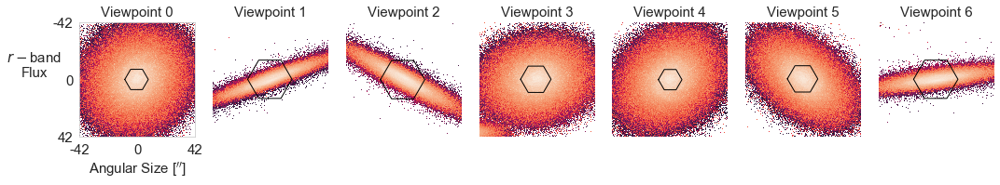

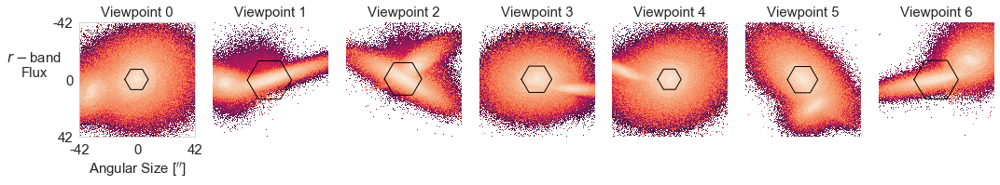

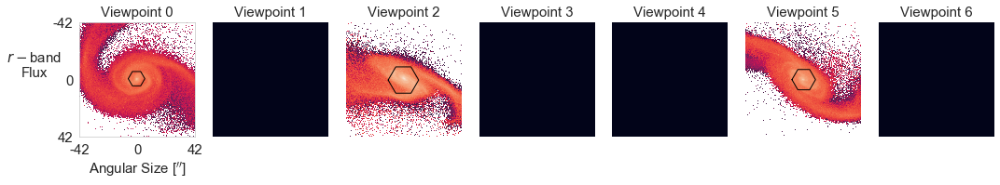

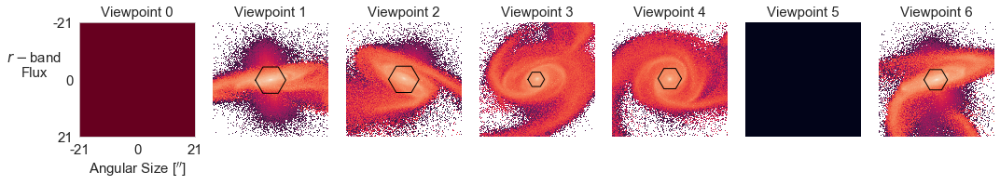

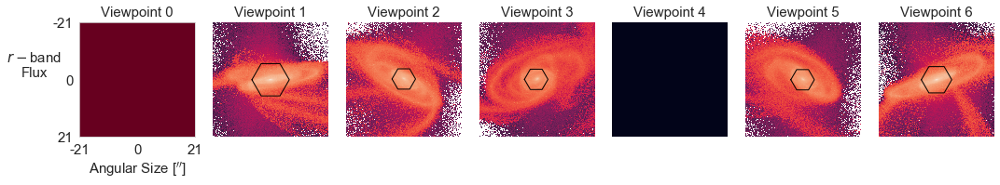

...

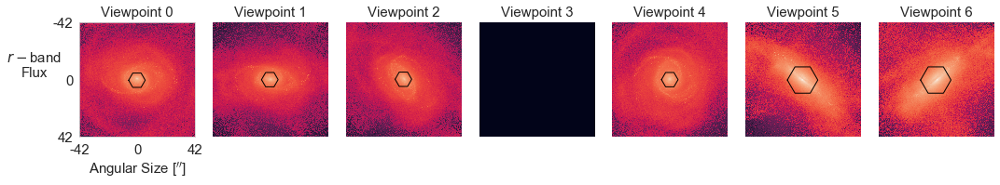

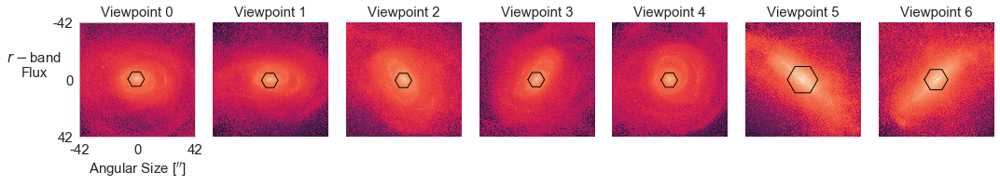

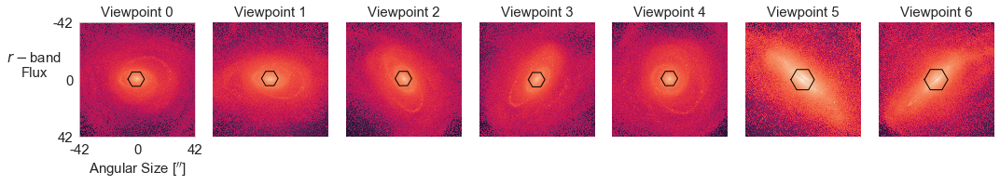

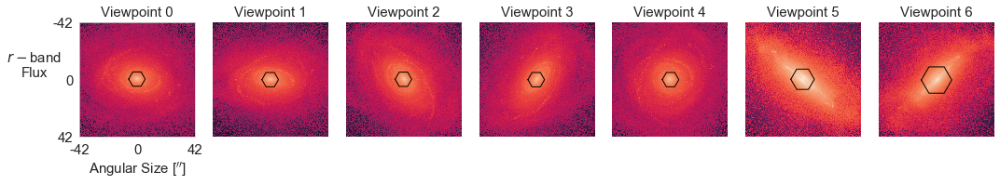

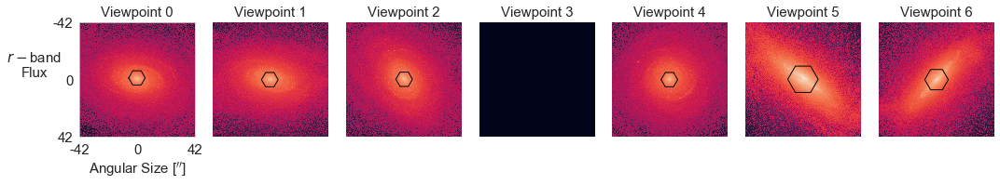

In [49]:
# This code creates all of the .png images, so I can only run it from my machine because it links to the
# kinematic cubes, which are somewhat large ('../kinematic_maps/kinematics...') and I don't want them
# on my Github

import astropy.io.fits as pyfits
import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})
# Step to make velocity plots

#fg3_m12
myr_list=[170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265,275,285, 295,305,311, 315,320,    5,10,20,30,40,60,80,100,120,140,160]
myr_list=[5,10,20,30,40,50,60,100,200]
myr_list=[5, 10, 30, 50, 200]

#fg3_m13
myr_list=[20,40,70,80,100,120,140,
    150,170,180,190,210,220,230,
    235,237,240,242,245,247,250,252,255,257,262,265,270,275,280,285,287,288,289,290,295,305]

run='fg3_m13'
view_list=[0,1,2,3,4,5,6]
degraded = 'degraded'
version = 'images'
#myr_list=[170]


for i in range(len(myr_list)):
    myr = myr_list[i]
    print('~~~~~~')
    print('Myr = '+str(myr))
    print('~~~~~~')
    fig, axs = plt.subplots(1,7, figsize=(15, 2.75), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = 0, wspace=.2)

    axs = axs.ravel()
    for j in range(len(view_list)):
        view = view_list[j]
        try:
            kin=pyfits.open('../kinematic_maps/kinematics_'+str(run)+'_'+str(myr)+'_'+str(view)+'_'+str(degraded)+'.fits')
            if run=='fg3_m12':
                if myr < 10:
                    prefix='00'
                else:
                    if myr < 100:
                        prefix='0'
                    else:
                        prefix=''
                if myr < 170:
                    broad = pyfits.open('../'+str(version)+'/q0.5_fg0.3_allrx10_sunruns/hires_kin_early_cen1/broadband_'+prefix+str(myr)+'.fits')
                else:
                    broad = pyfits.open('../'+str(version)+'/q0.5_fg0.3_allrx10_sunruns/hires_kin/broadband_'+prefix+str(myr)+'.fits')
            
            if run=='fg3_m13':
                if myr < 10:
                    prefix='00'
                else:
                    if myr < 100:
                        prefix='0'
                    else:
                        prefix=''
                if myr < 150:
                    broad = pyfits.open('../'+str(version)+'/q0.333_fg0.3_allrx10_sunruns/hires_kin_early_cen1/broadband_'+prefix+str(myr)+'.fits')
                else:
                    broad = pyfits.open('../'+str(version)+'/q0.333_fg0.3_allrx10_sunruns/hires_kin/broadband_'+prefix+str(myr)+'.fits')
            
            if run=='fg3_m12_iso1_rotated':
                if myr < 10:
                    prefix='00'
                else:
                    if myr < 100:
                        prefix='0'
                    else:
                        prefix=''
                broad = pyfits.open('../'+str(version)+'/isolated_galaxies/m1_fg0.3/rot_45/broadband_'+prefix+str(myr)+'.fits')
            if run=='fg3_m12_iso0.5_rotated':
                if myr < 10:
                    prefix='00'
                else:
                    if myr < 100:
                        prefix='0'
                    else:
                        prefix=''
                broad = pyfits.open('../'+str(version)+'/isolated_galaxies/m0.5_fg0.3/rot_45/broadband_'+prefix+str(myr)+'.fits')
                
        except FileNotFoundError:
            #could just be missing a viewpoint
            #so just construct a fake file
            fake = np.zeros((150,150))
            print('missing this viewpoint', j)
            if j ==0:
                im = axs[j].imshow(fake, norm=MidpointNormalize(midpoint=0), cmap='RdBu_r')
            
                axs[j].set_xticks([0,np.shape(fake)[0]/2, np.shape(fake)[0]])
                axs[j].set_yticks([0,np.shape(fake)[0]/2, np.shape(fake)[0]])
                axs[j].set_xticklabels([-round(size_a*(np.shape(fake)[0]/2)),0,round(size_a*(np.shape(fake)[0]/2))])
                axs[j].set_yticklabels([-round(size_a*(np.shape(fake)[0]/2)),0,round(size_a*(np.shape(fake)[0]/2))])
                axs[j].set_xlabel('Angular Size [$^{\prime\prime}$]', size=15)
                axs[j].tick_params(axis='both', which='major', labelsize=15)
                axs[j].set_ylabel('$r-$band\nFlux', size=15, rotation=0, labelpad=20)
                #cbaxes = fig.add_axes([0.07, 0.28, 0.01, 0.60]) 
                #cb = plt.colorbar(im, cax = cbaxes)#,fraction=0.046, pad=0.04) 
            else:
                axs[j].axis('off')
                axs[j].imshow(fake, norm=MidpointNormalize())
                axs[j].axis('off')
            axs[j].set_title('Viewpoint '+str(j), size=15)
            continue
        header_kin = kin[0].header
        image = broad['CAMERA'+str(view)+'-BROADBAND'].data
        broadband_r = image[2]
        pixelscale = broad['CAMERA'+str(view)+'-BROADBAND'].header['CD1_1']
        
        ## So this is in the original pixelscale which is 
        # Define cosmology
        from astropy.cosmology import FlatLambdaCDM
        cosmo = FlatLambdaCDM(H0=70,Om0=0.3)
        kpc_arcmin=cosmo.kpc_proper_per_arcmin(0.03)
        size_broad = pixelscale/(kpc_arcmin.value/60)#now we're in "/pix   
        size_a = size_broad
        
        
        ycen=float(header_kin['XC'])
        xcen=float(header_kin['YC'])
        
        n_fibers=float(header_kin['FIBER'])
        if n_fibers==127:
            dia = 32/size_a
        else:
            if n_fibers==91:
                dia = 27/size_a
            else:
                if n_fibers==61:
                    dia=22/size_a
                else:
                    if n_fibers==37:
                        dia=17/size_a
                    else:
                        dia = 12/size_a
        
        size = np.shape(broadband_r)[1]
        
        #coords=map_to_coords(broadband_r, size)
        
        x_list=[]
        y_list=[]


        for i in range(size):
            for k in range(size):
                x_list.append(i)
                y_list.append(k)

        #inside = mask_map(size,fiber[1], x_list, y_list, 0.396)#0.5)    

        import math
        from matplotlib import path
        radius=(dia)/2
       
    

        poly_verts = path.Path([(size/2,size/2-radius),
                                (size/2+(np.sqrt(3)/2)*radius,size/2-radius+radius/2),
                                (size/2+(np.sqrt(3)/2)*radius,size/2+radius-radius/2),
                                (size/2, size/2+radius),
                                (size/2-(np.sqrt(3)/2)*radius,size/2+radius-radius/2),
                               (size/2-(np.sqrt(3)/2)*radius,size/2-radius+radius/2)])

        xs = [size/2,size/2+(np.sqrt(3)/2)*radius,size/2+(np.sqrt(3)/2)*radius,size/2, size/2-(np.sqrt(3)/2)*radius,size/2-(np.sqrt(3)/2)*radius,size/2]
        ys = [size/2-radius,size/2-radius+radius/2,size/2+radius-radius/2,size/2+radius,size/2+radius-radius/2,size/2-radius+radius/2,size/2-radius]

        
            

        # The OG broadband image has an arcsec/pixel scale of 0.277
        # But we need this in terms of the 0.396 image sized pixels so use a ratio
        reduce = 1#(size_broad/0.396)

        #This was how I was doing it:
        #xs_plot = [x+(xcen_g - size/2) for x in inside[3]]
        #ys_plot = [y+(ycen_g - size/2) for y in inside[2]]

        xs_plot = [x+reduce*( xcen - 150) for x in ys]
        ys_plot = [y+reduce*( ycen - 150) for y in xs]
        
        
        
        if j ==0:
            im = axs[j].imshow(abs(broadband_r), norm=matplotlib.colors.LogNorm())
            axs[j].plot(xs_plot, ys_plot, lw=1, color='black')
            #axs[j].scatter(np.shape(broadband_r)[0]/2,np.shape(broadband_r)[0]/2,marker='x', color='black')
            axs[j].set_xticks([0,np.shape(broadband_r)[0]/2, np.shape(broadband_r)[0]])
            axs[j].set_yticks([0,np.shape(broadband_r)[0]/2, np.shape(broadband_r)[0]])
            axs[j].set_xticklabels([-round(size_a*(np.shape(broadband_r)[0]/2)),0,round(size_a*(np.shape(broadband_r)[0]/2))])
            axs[j].set_yticklabels([-round(size_a*(np.shape(broadband_r)[0]/2)),0,round(size_a*(np.shape(broadband_r)[0]/2))])

            # Now adding the colorbar
            #cbaxes = fig.add_axes([0.07, 0.28, 0.01, 0.60]) 
            #cb = plt.colorbar(im, cax = cbaxes)#,fraction=0.046, pad=0.04) 
            #plt.colorbar(im)
            axs[j].set_xlabel('Angular Size [$^{\prime\prime}$]', size=15)
            axs[j].tick_params(axis='both', which='major', labelsize=15)
            axs[j].set_ylabel('$r-$band\nFlux', size=15, rotation=0, labelpad=20)
        else:
            im = axs[j].imshow(abs(broadband_r), norm=matplotlib.colors.LogNorm())
            #axs[j].scatter(np.shape(broadband_r)[0]/2,np.shape(broadband_r)[0]/2,marker='x', color='black')
            
            axs[j].plot(xs_plot, ys_plot, lw=1, color='black')
            axs[j].axis('off')
        axs[j].set_title('Viewpoint '+str(j), size=15)
        #plt.colorbar(im)
    plt.tight_layout()
    plt.savefig(str(run)+'_panels_'+str(degraded)+'/image_panel_'+str(run)+'_'+str(myr)+'.png', dpi=1000, bbox_to_inches='tight')
    
    
    
    

In [31]:
# Okay so there are three main aspects that I'd like to see with this interactive fig - 

# First I'd like to display all plots for all viewpoints for a moment in time, and the real challenge
# is that I'd like to display these .png images below the main figure, not just as a hover tool feature

# Second, I'd like to be able to togle through the different mountain plots for each simulation
# (this doesn't seem too hard to do)

# Third, I'd like to display using some sort of a tap select or hover the LDA value at each moment in time
# on the top plot (this is done)

In [72]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import Band
from bokeh.plotting import figure, output_file, show, ColumnDataSource
from bokeh.models import Title
from bokeh.models.widgets import Panel, Tabs
from bokeh.models import ColumnDataSource, Range1d, LabelSet, Label, Circle, CustomJS
from bokeh.models import Arrow, OpenHead, NormalHead, VeeHead
from bokeh.models import Span
from bokeh.models import Range1d
from bokeh.layouts import gridplot
from bokeh.models import HoverTool 

In [73]:
output_notebook()

Loading BokehJS ...

In [87]:
### Trying to make multiple tabs :)
# This is the code for creating hte mountin.html plot that is on my website
# I would like to modify it to 
output_file("mountin_img_tabs.html")

'''myr_list = [40,60,80,100,120,140,160,170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265]
    myr_list_sorted_left = [5,10,20,30,40,50,60,100,200]
    myr_list_sorted_right = [275,285,295,305,311,315,320]'''

#[0.39 0.59 0.78 0.98 1.17 1.37 1.56 1.66 1.76 1.81 2.   2.05 2.15 2.2 2.25 2.35 2.44 2.54 2.59]
#took out - 100, 140
myr_list_names=[[40,60,80,100,
                 120,140,160,
                 170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265],
                [40,70,80,100,120,140,
    150,170,180,190,210,220,230,
    235,237,240,242,245,247,250,252,255,257,262,265,270,275,280,285,287,288,289,290,295,305]]
myr_list_names_late=[[275,285,295,305,311,315,320],
                     [290,295,305]]
myr_list_names_early=[[5,10,20,30,40,50,60,100,200],
                     [5,10,20,30,40,50,60,100,200]]
title_list = [r'q = 0.5, fg = 0.3', r'q = 0.333, fg = 0.3']
prefix_list = ['fg3_m12', 'fg3_m13']
iso_prefix_1_list = ['fg3_m12_iso1', 'fg3_m12_iso1']
iso_prefix_2_list = ['fg3_m12_iso0.5', '']
tab_list = []
for h in range(len(title_list)):
    
    sort_coef = significant_coef_list[h]
    
    sort_std = significant_std_list[h]
    sortedinput=significant_term_list[h]
    
    myr_list = myr_list_list[h]
    myr_list_sorted_left = myr_list_sorted_left_list[h]
    myr_list_sorted_right = myr_list_sorted_right_list[h]
    
    #~~~~~~
    myr_list_name = myr_list_names[h]
    myr_list_name_right = myr_list_names_late[h]
    myr_list_name_left = myr_list_names_early[h]
    #~~~~~~
    myr_here = myr_here_list[h]
    myr_here_non_left = myr_here_non_left_list[h]
    myr_here_non_right = myr_here_non_right_list[h]
    
    
    
    input_1_means = input_1_means_list[h]
    input_2_means = input_2_means_list[h]
    input_3_means = input_3_means_list[h]
    
    input_1_means_non = input_1_means_list_non[h]
    input_2_means_non = input_2_means_list_non[h]
    input_3_means_non = input_3_means_list_non[h]
    
    list_inter = list_inter_list[h]
    new_min_index = new_min_index_list[h]
    
    new_means = new_means_list[h]
    std = std_list[h]
    
    iso_prefix_1 = iso_prefix_1_list[h]
    iso_prefix_2 = iso_prefix_2_list[h]
    prefix = prefix_list[h]
    mean_non = mean_non_list[h]
    
    coalescence = coalescence_list[h]
    early = early_list[h]
    
    new_means_non_left = new_means_non_left_list[h]
    std_non_left = std_non_left_list[h]
    
    new_means_non_right = new_means_non_right_list[h]
    std_non_right = std_non_right_list[h]
    

    LDA_act = []
    LDA_l = []
    up = []
    low = []
    img_list = []
    img_disp_list = []

    

    # Okay but the trick is that for the early-stage isolated galaxies they are a combination
    # of two different merger simulations AND the early-stage (pre-pericentric passage) mergers
    # So you'll need to show multiple maps
    # 5,10,20,30 from the merger
    # #myr_list=[5,10,20,30,40,50,60,100,200] from iso1
    #myr_list=[5, 10, 30, 50, 200] from iso0.5


    myr_list_sorted = sorted(myr_list)
    myr_list_names_sorted = sorted(myr_list_name)
    
    print('myr_list_sorted', myr_list_sorted)
    print('myr_list_names_sorted', myr_list_names_sorted)


    #myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 2.69, 2.79, 3.62, 4.6, 5.18, 5.57, 6.06]
    #myr_list=[170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265,275,285, 295,305,311, 315,320]



    for j in range(len(myr_here)):
        LDA_act.append(str(round(sort_coef[-1]*input_1_means[j],1))+' + '+str(round(sort_coef[-2]*input_2_means[j],1))+' + '+str(round(sort_coef[-3]*input_3_means[j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        LDA_l.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        up.append(new_means[j]+std[j])
        low.append(new_means[j]-std[j])
        img_list.append('https://github.com/beckynevin/interactive_figs/blob/master/'+prefix+'_panels_degraded/image_panel_'+prefix+'_'+str(myr_list_names_sorted[j])+'.png?raw=true')

    up_left=[]
    low_left=[]
    LDA_act_left=[]
    LDA_l_left=[]
    img_disp_list_left=[]
    img_list_left=[]
    img_list_left_alt=[]
    img_list_left_alt_2=[]
    for j in range(len(myr_here_non_left)):
        LDA_act_left.append(str(round(sort_coef[-1]*input_1_means_non[j],1))+' + '+str(round(sort_coef[-2]*input_2_means_non[j],1))+' + '+str(round(sort_coef[-3]*input_3_means_non[j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        LDA_l_left.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        up_left.append(new_means_non_left[j]+std_non_left[j])
        low_left.append(new_means_non_left[j]-std_non_left[j])
        if myr_list_sorted_left[j]<40:
            try:
                img_list_left.append('https://github.com/beckynevin/interactive_figs/blob/master/'+prefix+'_panels_degraded/image_panel_'+prefix+'_'+str(myr_list_name_left[j])+'.png?raw=true')
            except:
                img_list_left.append('')
        else:
            img_list_left.append('')
        try:
            img_list_left_alt.append('https://github.com/beckynevin/interactive_figs/blob/master/'+iso_prefix_1+'_rotated_panels_degraded/image_panel_'+iso_prefix_1+'_rotated_'+str(myr_list_name_left[j])+'.png?raw=true')
        except:
            img_list_left_alt.append('')
        try:
            img_list_left_alt_2.append('https://github.com/beckynevin/interactive_figs/blob/master/'+iso_prefix_2+'_rotated_panels_degraded/image_panel_'+iso_prefix_2+'_rotated_'+str(myr_list_name_left[j])+'.png?raw=true')
        except:
            img_list_left_alt_2.append('')


    print('images from the myr', img_list_left)
    up_right=[]
    low_right=[]
    LDA_act_right=[]
    LDA_l_right=[]
    img_disp_list_right=[]
    img_list_right=[]
    for j in range(len(myr_here_non_right)):#myr_list_sorted_right
        LDA_act_right.append(str(round(sort_coef[-1]*input_1_means_non[len(myr_here_non_right):][j],1))+' + '+str(round(sort_coef[-2]*input_2_means_non[len(myr_here_non_right):][j],1))+' + '+str(round(sort_coef[-3]*input_3_means_non[len(myr_here_non_right):][j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        LDA_l_right.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
        up_right.append(new_means_non_right[j]+std_non_right[j])
        low_right.append(new_means_non_right[j]-std_non_right[j])
        img_list_right.append('https://github.com/beckynevin/interactive_figs/blob/master/'+prefix+'_panels_degraded/image_panel_'+prefix+'_'+str(myr_list_name_right[j])+'.png?raw=true')

    source = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted,
        x=myr_here,
        y=new_means,
        upper=up,
        lower=low,
        desc=myr_here,
        LDA_list=LDA_l,
        LDA_actual=LDA_act,
        imgs=img_list))

    source1 = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted_left,
        x1=myr_here_non_left,
        y1=new_means_non_left,
        upper_l = up_left,
        lower_l = low_left,
        desc=myr_here_non_left,
        LDA_list_left=LDA_l_left,
        LDA_actual_left=LDA_act_left,
        imgs_left=img_list_left,
        imgs_left_alt = img_list_left_alt,
        imgs_left_alt_2 = img_list_left_alt_2))

    source2 = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted_right,
        x2=myr_here_non_right,
        y2=new_means_non_right,
        upper_r = up_right,
        lower_r = low_right,
        desc=myr_here_non_right,
        LDA_list_right=LDA_l_right,
        LDA_actual_right=LDA_act_right,
        imgs_right=img_list_right))

    TOOLTIPS = """
        <div>

                <img
                    src="@imgs" height="120" alt="@imgs" width="700"
                    style="float: center; margin: 0px 15px 15px 0px;"
                ></img>

            <div>
                <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list</span>
            </div>
            <div>
            <span style="font-size: 17px; font-weight: bold;">@y = @LDA_actual</span>
            </div>


        </div>
    """

    TOOLTIPS1 = """
        <div>

                <img
                    src="@imgs_left" height="120" alt="@imgs_left" width="700"
                    style="float: center; margin: 0px 0px 0px 0px;"
                ></img>

            <div>
            <img
                    src="@imgs_left_alt" height="120" alt="@imgs_left_alt" width="700"
                    style="float: center; margin: 0px 0px 0px 0px;"
                ></img>
            <div>
            <img
                    src="@imgs_left_alt_2" height="120" alt="@imgs_left_alt_2" width="700"
                    style="float: center; margin: 0px 0px 0px 0px;"
                ></img>
            <div>
                <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list_left</span>
            </div>
            <div>
            <span style="font-size: 17px; font-weight: bold;">@y1 = @LDA_actual_left</span>
            </div>

        </div>
    """

    TOOLTIPS2 = """
        <div>

                <img
                    src="@imgs_right" height="120" alt="@imgs_right" width="700"
                    style="float: center; margin: 0px 15px 15px 0px;"
                ></img>

            <div>
                <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list_right</span>
            </div>
            <div>
            <span style="font-size: 17px; font-weight: bold;">@y2 = @LDA_actual_right</span>
            </div>

        </div>
    """


    p = figure(plot_width=1300, plot_height=400,background_fill_color='#bdbcbd')#, tooltips=TOOLTIPS)
    #p = figure(tools="wheel_zoom,reset", match_aspect=True, )
    p.xgrid[0].grid_line_color=None
    p.ygrid[0].grid_line_alpha=0.5

    # Vertical line
    vline1 = Span(location=early, dimension='height', line_color='black', line_width=2,line_dash='dashed')
    vline2 = Span(location=coalescence, dimension='height', line_color='black', line_width=2,line_dash='dashed')
    vline3 = Span(location=coalescence+0.5, dimension='height', line_color='black', line_width=2,line_dash='dashed')

    # Horizontal line
    hline = Span(location=mean_non, dimension='width', line_color='black', line_width=2)

    p.renderers.extend([vline1, vline2, vline3, hline])


    p.line('x', 'y', color=colors[h], source=source, legend_label='Merger')

    #r0_invisible = Circle(x='x', y='y', fill_color='gray', fill_alpha = 0.05, size=7)#, legend_label='Merger',source=source,hover_fill_color='red', hover_alpha=1)#, zorder=100)
    #r0_visible = Circle(x='x', y='y', fill_color='red', size=7, fill_alpha=0.5)#,source=source,hover_fill_color='red', hover_alpha=1)#, zorder=100)
    #r0 = p.add_glyph(source, r0_invisible, selection_glyph = r0_visible, nonselection_glyph=r0_invisible)
    r0 = p.circle(x='x', y='y', fill_color=colors[h], line_color='black',fill_alpha=0.5,size=12, source=source, legend_label='Merger')#was p.circle

    #r0_invisible = Circle(x='x', y='y', fill_color='gray', fill_alpha=0.05, line_color=None,  size=7)

    #p.add_tools(HoverTool(renderers=[r0], tooltips=TOOLTIPS, renderers=[cr]))




    #invisible_circle = Circle(x='x', y='y', fill_color='gray', fill_alpha=0.05, line_color=None, size=20)
    #visible_circle = Circle(x='x', y='y', fill_color='firebrick', fill_alpha=0.5, line_color=None, size=20)
    #cr = p.add_glyph(source, r0_invisible, selection_glyph=r0, nonselection_glyph=r0_invisible)

    # Add a hover tool, that selects the circle
    #code = "var indices = cb_data.renderer.data_source.inspected['1d'].indices;" 
    #"source.set('selected', cb_data['index']);"

    #var indices = cb_data.renderer.data_source.inspected['1d'].indices;
    #callback = CustomJS(args={'source': source}, code=code)
    p.add_tools(HoverTool(tooltips=TOOLTIPS,  renderers=[r0]))#, mode='hline'))







    p.xgrid.grid_line_color=None
    p.ygrid.grid_line_alpha=0.5

    band = Band(base='x', lower='lower', upper='upper', source = source ,level='underlay',
                fill_alpha=0.25, line_width=0, fill_color=colors[h])
    p.add_layout(band)


    p.line('x1', 'y1', color='blue', source=source1, legend_label='Nonmerger')
    r1 = p.circle('x1','y1', fill_color='blue', line_color='black', size=12, source=source1, legend_label='Nonmerger', fill_alpha=0.5)
    band = Band(base='x1', lower='lower_l', upper='upper_l', source = source1 ,level='underlay',
                fill_alpha=0.25, line_width=0, fill_color='blue')
    p.add_layout(band)

    p.add_tools(HoverTool(renderers=[r1], tooltips=TOOLTIPS1))


    p.line('x2','y2', color='blue', source=source2)
    r2 = p.circle('x2','y2',  line_color='black', size=12, source=source2, fill_color='blue', fill_alpha=0.5)#, nonselection_line_color="", nonselection_line_alpha=1.0)


    band = Band(base='x2', lower='lower_r', upper='upper_r', source = source2 ,level='underlay',
                fill_alpha=0.25, line_width=0, fill_color='blue')
    p.add_layout(band)

    p.add_tools(HoverTool(renderers=[r2], tooltips=TOOLTIPS2))
    #axes.set_xlim([min([min(myr_non),min(myr)]),max([max(myr_non),max(myr)])]) 

    ymax =  max(new_means+std)
    ymin = min(min(new_means_non_left-std_non_left),min(new_means_non_right-std_non_right))

    #p.x_range=Range1d(min(myr_here_non_left), max(myr_here_non_right))
    p.y_range=Range1d(min(min(new_means_non_left-std_non_left),min(new_means_non_right-std_non_right)), max(new_means+std))


    #labels = LabelSet(x='x', y='y', text='x', level='glyph',
    #              x_offset=5, y_offset=5, source=source, render_mode='canvas')

    peri = Label(x=myr_here[0], y=mean_non, x_units='data', y_units='data',
                     text='First Pericentric Passage', render_mode='css',
                     border_line_color='black', border_line_alpha=0.0,
                     background_fill_color='white', background_fill_alpha=0.0)
    coal = Label(x=coalescence+0.03, y=mean_non, x_units='data', y_units='data',
                     text='Coalescence', render_mode='css',
                     border_line_color='black', border_line_alpha=0.0,
                     background_fill_color='white', background_fill_alpha=0.0)

    # Now all the merger stages labels, maybe place them down below?
    PC = Label(x=coalescence+0.03, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                     text='Post-Coalescence', render_mode='css',
                     border_line_color='black', border_line_alpha=0.20,
                     background_fill_color=colors[h], background_fill_alpha=0.4)

    L = Label(x=early+0.1, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                     text='Late', render_mode='css',
                     border_line_color='black', border_line_alpha=0.3,
                     background_fill_color=colors[h], background_fill_alpha=0.4)

    E = Label(x=early-0.3, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                     text='Early', render_mode='css',
                     border_line_color='black', border_line_alpha=0.3,
                     background_fill_color=colors[h], background_fill_alpha=0.4)


    p.add_layout(Arrow(end=VeeHead(size=10), line_color="black",
                       x_start=myr_here[0]+0.1, y_start=mean_non, x_end=myr_here[0], y_end=new_means[0]+0.2))
    p.add_layout(Arrow(end=VeeHead(size=10), line_color="black",
                       x_start=coalescence+0.1, y_start=mean_non, x_end=coalescence, y_end=new_means[np.where(myr_here==coalescence)][0]+0.2))
    p.add_layout(Title(text="Merger Timeline [Gyr]", align="center"), "below")
    p.add_layout(Title(text="LD1", align="center"), "left")

    #p.add_layout(labels)
    p.add_layout(peri)
    p.add_layout(coal)
    p.add_layout(PC)
    p.add_layout(E)
    p.add_layout(L)

    empty = figure(plot_width=1300, plot_height=400,background_fill_color='white',x_range=(0,1), y_range=(0,1))
    empty.image_url(url='imgs', x=0, y=1, w=0.9, h=0.5, source=source)
    #empty.image_url(url=['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_@myr_name_list.png?raw=true'], x=0, y=0.75, w=0.5, h=0.8)


    #div_image = empty.image_url(url=['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_10.png?raw=true'], x=0, y=0.75, w=0.5, h=0.8)

    #def update(pokemon_number=10):
    #    div_image.text = """<img src="https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_{}.png?raw=true" alt="div_image">""".format(pokemon_number)
    #    push_notebook()


    #interact(update, pokemon_number=myr_here)
    empty.xgrid[0].grid_line_color=None
    empty.ygrid[0].grid_line_alpha=0.0
    empty.axis.visible = False






    p1 = gridplot([p], ncols=1)

    tab = Panel(child=p1, title=title_list[h])
    tab_list.append(tab)
tabs = Tabs(tabs=tab_list)


'''show(tabs, notebook_handle=True)

interact(update, pokemon_number=[10, 40, 70])'''

show(tabs) # show the results




myr_list_sorted [0.39, 0.59, 0.78, 0.98, 1.17, 1.37, 1.56, 1.66, 1.76, 1.81, 2.0, 2.05, 2.15, 2.2, 2.25, 2.35, 2.44, 2.54, 2.59]
myr_list_names_sorted [40, 60, 80, 100, 120, 140, 160, 170, 180, 185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260, 265]
images from the myr ['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_5.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_10.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_20.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_30.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_40.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_50.png?raw=t

In [38]:
print(myr_list_list)

[]


In [27]:
# This is the code for creating hte mountin.html plot that is on my website
# I would like to modify it to 
output_file("mountin_img.html")


print('sorted inputs', sortedinput)
sort_coef = significant_coef
sort_std = significant_std
print('coeff', sort_coef )
print('std', sort_std)
sortedinput=significant_term

LDA_act = []
LDA_l = []
up = []
low = []
img_list = []
img_disp_list = []

myr_list = [40,60,80,100,120,140,160,170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265]
myr_list_sorted_left = [5,10,20,30,40,50,60,100,200]
myr_list_sorted_right = [275,285,295,305,311,315,320]

# Okay but the trick is that for the early-stage isolated galaxies they are a combination
# of two different merger simulations AND the early-stage (pre-pericentric passage) mergers
# So you'll need to show multiple maps
# 5,10,20,30 from the merger
# #myr_list=[5,10,20,30,40,50,60,100,200] from iso1
#myr_list=[5, 10, 30, 50, 200] from iso0.5


myr_list_sorted = sorted(myr_list)


#myr_non [0.05, 0.1, 0.2, 0.29, 0.39, 0.49, 0.59, 0.98, 1.96, 2.69, 2.79, 3.62, 4.6, 5.18, 5.57, 6.06]
#myr_list=[170,180,185, 190, 195, 205, 210, 220, 225, 230, 240, 250, 260,265,275,285, 295,305,311, 315,320]



for j in range(len(myr_here)):
    LDA_act.append(str(round(sort_coef[-1]*input_1_means[j],1))+' + '+str(round(sort_coef[-2]*input_2_means[j],1))+' + '+str(round(sort_coef[-3]*input_3_means[j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    LDA_l.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    up.append(new_means[j]+std[j])
    low.append(new_means[j]-std[j])
    img_disp_list.append('https://github.com/beckynevin/interactive_figs/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted[j])+'.png?raw=true')
    img_list.append('https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted[j])+'.png?raw=true')

up_left=[]
low_left=[]
LDA_act_left=[]
LDA_l_left=[]
img_disp_list_left=[]
img_list_left=[]
img_list_left_alt=[]
img_list_left_alt_2=[]
for j in range(len(myr_here_non_left)):
    LDA_act_left.append(str(round(sort_coef[-1]*input_1_means_non[j],1))+' + '+str(round(sort_coef[-2]*input_2_means_non[j],1))+' + '+str(round(sort_coef[-3]*input_3_means_non[j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    LDA_l_left.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    up_left.append(new_means_non_left[j]+std_non_left[j])
    low_left.append(new_means_non_left[j]-std_non_left[j])
    img_disp_list_left.append('https://github.com/beckynevin/interactive_figs/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted_left[j])+'.png?raw=true')
    if myr_list_sorted_left[j]<40:
        try:
            img_list_left.append('https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted_left[j])+'.png?raw=true')
        except:
            img_list_left.append('')
    else:
        img_list_left.append('')
    try:
        img_list_left_alt.append('https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_iso1_rotated_panels_degraded/image_panel_fg3_m12_iso1_rotated_'+str(myr_list_sorted_left[j])+'.png?raw=true')
    except:
        img_list_left_alt.append('')
    try:
        img_list_left_alt_2.append('https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_iso0.5_rotated_panels_degraded/image_panel_fg3_m12_iso0.5_rotated_'+str(myr_list_sorted_left[j])+'.png?raw=true')
    except:
        img_list_left_alt_2.append('')
    
    
print('images from the myr', img_list_left)
up_right=[]
low_right=[]
LDA_act_right=[]
LDA_l_right=[]
img_disp_list_right=[]
img_list_right=[]
for j in range(len(myr_here_non_right)):
    LDA_act_right.append(str(round(sort_coef[-1]*input_1_means_non[len(myr_here_non_left):][j],1))+' + '+str(round(sort_coef[-2]*input_2_means_non[len(myr_here_non_left):][j],1))+' + '+str(round(sort_coef[-3]*input_3_means_non[len(myr_here_non_left):][j],1))+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    LDA_l_right.append(str(round(sort_coef[-1],1))+' '+sortedinput[-1]+' + '+str(round(sort_coef[-2],1))+' '+sortedinput[-2]+' + '+str(round(sort_coef[-3],1))+' '+sortedinput[-3]+' + ... + '+str(round(list_inter[new_min_index][0],1)))
    up_right.append(new_means_non_right[j]+std_non_right[j])
    low_right.append(new_means_non_right[j]-std_non_right[j])
    img_disp_list_right.append('https://github.com/beckynevin/interactive_figs/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted_right[j])+'.png?raw=true')
    img_list_right.append('https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_'+str(myr_list_sorted_right[j])+'.png?raw=true')

source = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted,
    x=myr_here,
    y=new_means,
    upper=up,
    lower=low,
    desc=myr_here,
    LDA_list=LDA_l,
    LDA_actual=LDA_act,
    imgs=img_list,
    imgs_disp = img_disp_list))

source1 = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted_left,
    x1=myr_here_non_left,
    y1=new_means_non_left,
    upper_l = up_left,
    lower_l = low_left,
    desc=myr_here_non_left,
    LDA_list_left=LDA_l_left,
    LDA_actual_left=LDA_act_left,
    imgs_left=img_list_left,
    imgs_left_alt = img_list_left_alt,
    imgs_left_alt_2 = img_list_left_alt_2,
    imgs_disp_left = img_disp_list_left))

source2 = ColumnDataSource(data=dict(myr_name_list=myr_list_sorted_right,
    x2=myr_here_non_right,
    y2=new_means_non_right,
    upper_r = up_right,
    lower_r = low_right,
    desc=myr_here_non_right,
    LDA_list_right=LDA_l_right,
    LDA_actual_right=LDA_act_right,
    imgs_right=img_list_right,
    imgs_disp_right = img_disp_list_right))

TOOLTIPS = """
    <div>
        
            <img
                src="@imgs" height="120" alt="@imgs" width="700"
                style="float: center; margin: 0px 15px 15px 0px;"
            ></img>
        
        <div>
            <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list</span>
        </div>
        <div>
        <span style="font-size: 17px; font-weight: bold;">@y = @LDA_actual</span>
        </div>
        
      
    </div>
"""

TOOLTIPS1 = """
    <div>
        
            <img
                src="@imgs_left" height="120" alt="No fg3_m12" width="700"
                style="float: center; margin: 0px 0px 0px 0px;"
            ></img>
        
        <div>
        <img
                src="@imgs_left_alt" height="120" alt="No fg3_m12_iso1" width="700"
                style="float: center; margin: 0px 0px 0px 0px;"
            ></img>
        <div>
        <img
                src="@imgs_left_alt_2" height="120" alt="No fg3_m12_iso0.5" width="700"
                style="float: center; margin: 0px 0px 0px 0px;"
            ></img>
        <div>
            <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list_left</span>
        </div>
        <div>
        <span style="font-size: 17px; font-weight: bold;">@y1 = @LDA_actual_left</span>
        </div>
        
    </div>
"""

TOOLTIPS2 = """
    <div>
        
            <img
                src="@imgs_right" height="120" alt="@imgs_right" width="700"
                style="float: center; margin: 0px 15px 15px 0px;"
            ></img>
        
        <div>
            <span style="font-size: 17px; font-weight: bold;">LD1 = @LDA_list_right</span>
        </div>
        <div>
        <span style="font-size: 17px; font-weight: bold;">@y2 = @LDA_actual_right</span>
        </div>
        
    </div>
"""


p = figure(plot_width=1300, plot_height=400,background_fill_color='#bdbcbd')#, tooltips=TOOLTIPS)
#p = figure(tools="wheel_zoom,reset", match_aspect=True, )
p.xgrid[0].grid_line_color=None
p.ygrid[0].grid_line_alpha=0.5

# Vertical line
vline1 = Span(location=early, dimension='height', line_color='black', line_width=2,line_dash='dashed')
vline2 = Span(location=coalescence, dimension='height', line_color='black', line_width=2,line_dash='dashed')
vline3 = Span(location=coalescence+0.5, dimension='height', line_color='black', line_width=2,line_dash='dashed')

# Horizontal line
hline = Span(location=mean_non, dimension='width', line_color='black', line_width=2)

p.renderers.extend([vline1, vline2, vline3, hline])


p.line('x', 'y', color='red', source=source, legend_label='Merger')

#r0_invisible = Circle(x='x', y='y', fill_color='gray', fill_alpha = 0.05, size=7)#, legend_label='Merger',source=source,hover_fill_color='red', hover_alpha=1)#, zorder=100)
#r0_visible = Circle(x='x', y='y', fill_color='red', size=7, fill_alpha=0.5)#,source=source,hover_fill_color='red', hover_alpha=1)#, zorder=100)
#r0 = p.add_glyph(source, r0_invisible, selection_glyph = r0_visible, nonselection_glyph=r0_invisible)
r0 = p.circle(x='x', y='y', fill_color='red', line_color='black',fill_alpha=0.5,size=12, source=source, legend_label='Merger')#was p.circle

#r0_invisible = Circle(x='x', y='y', fill_color='gray', fill_alpha=0.05, line_color=None,  size=7)

#p.add_tools(HoverTool(renderers=[r0], tooltips=TOOLTIPS, renderers=[cr]))




#invisible_circle = Circle(x='x', y='y', fill_color='gray', fill_alpha=0.05, line_color=None, size=20)
#visible_circle = Circle(x='x', y='y', fill_color='firebrick', fill_alpha=0.5, line_color=None, size=20)
#cr = p.add_glyph(source, r0_invisible, selection_glyph=r0, nonselection_glyph=r0_invisible)

# Add a hover tool, that selects the circle
#code = "var indices = cb_data.renderer.data_source.inspected['1d'].indices;" 
#"source.set('selected', cb_data['index']);"

#var indices = cb_data.renderer.data_source.inspected['1d'].indices;
#callback = CustomJS(args={'source': source}, code=code)
p.add_tools(HoverTool(tooltips=TOOLTIPS,  renderers=[r0]))#, mode='hline'))







p.xgrid.grid_line_color=None
p.ygrid.grid_line_alpha=0.5
    
band = Band(base='x', lower='lower', upper='upper', source = source ,level='underlay',
            fill_alpha=0.25, line_width=0, fill_color='red')
p.add_layout(band)


p.line('x1', 'y1', color='blue', source=source1, legend_label='Nonmerger')
r1 = p.circle('x1','y1', fill_color='blue', line_color='black', size=12, source=source1, legend_label='Nonmerger', fill_alpha=0.5)
band = Band(base='x1', lower='lower_l', upper='upper_l', source = source1 ,level='underlay',
            fill_alpha=0.25, line_width=0, fill_color='blue')
p.add_layout(band)

p.add_tools(HoverTool(renderers=[r1], tooltips=TOOLTIPS1))


p.line('x2','y2', color='blue', source=source2)
r2 = p.circle('x2','y2',  line_color='black', size=12, source=source2, fill_color='blue', fill_alpha=0.5)#, nonselection_line_color="", nonselection_line_alpha=1.0)


band = Band(base='x2', lower='lower_r', upper='upper_r', source = source2 ,level='underlay',
            fill_alpha=0.25, line_width=0, fill_color='blue')
p.add_layout(band)

p.add_tools(HoverTool(renderers=[r2], tooltips=TOOLTIPS2))
#axes.set_xlim([min([min(myr_non),min(myr)]),max([max(myr_non),max(myr)])]) 

ymax =  max(new_means+std)
ymin = min(min(new_means_non_left-std_non_left),min(new_means_non_right-std_non_right))
    
p.x_range=Range1d(min(myr_here_non_left), max(myr_here_non_right))
p.y_range=Range1d(min(min(new_means_non_left-std_non_left),min(new_means_non_right-std_non_right)), max(new_means+std))


#labels = LabelSet(x='x', y='y', text='x', level='glyph',
#              x_offset=5, y_offset=5, source=source, render_mode='canvas')

peri = Label(x=myr_here[0], y=ymax-(ymax-ymin)/7, x_units='data', y_units='data',
                 text='First Pericentric Passage', render_mode='css',
                 border_line_color='black', border_line_alpha=0.0,
                 background_fill_color='white', background_fill_alpha=0.0)
coal = Label(x=coalescence+0.03, y=ymax-(ymax-ymin)/7, x_units='data', y_units='data',
                 text='Coalescence', render_mode='css',
                 border_line_color='black', border_line_alpha=0.0,
                 background_fill_color='white', background_fill_alpha=0.0)

# Now all the merger stages labels, maybe place them down below?
PC = Label(x=coalescence+0.03, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                 text='Post-Coalescence', render_mode='css',
                 border_line_color='black', border_line_alpha=0.20,
                 background_fill_color='red', background_fill_alpha=0.4)

L = Label(x=early+0.1, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                 text='Late', render_mode='css',
                 border_line_color='black', border_line_alpha=0.3,
                 background_fill_color='red', background_fill_alpha=0.4)

E = Label(x=early-0.3, y=ymax-(ymax-ymin)/13, x_units='data', y_units='data',
                 text='Early', render_mode='css',
                 border_line_color='black', border_line_alpha=0.3,
                 background_fill_color='red', background_fill_alpha=0.4)


p.add_layout(Arrow(end=VeeHead(size=10), line_color="black",
                   x_start=myr_here[0], y_start=ymax-(ymax-ymin)/7, x_end=myr_here[0], y_end=new_means[0]+0.2))
p.add_layout(Arrow(end=VeeHead(size=10), line_color="black",
                   x_start=coalescence+0.03, y_start=ymax-(ymax-ymin)/7, x_end=coalescence, y_end=new_means[coal_i][0]+0.2))
p.add_layout(Title(text="Merger Timeline [Gyr]", align="center"), "below")
p.add_layout(Title(text="LD1", align="center"), "left")

#p.add_layout(labels)
p.add_layout(peri)
p.add_layout(coal)
p.add_layout(PC)
p.add_layout(E)
p.add_layout(L)

empty = figure(plot_width=1300, plot_height=400,background_fill_color='white',x_range=(0,1), y_range=(0,1))
empty.image_url(url='imgs', x=0, y=1, w=0.9, h=0.5, source=source)
#empty.image_url(url=['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_@myr_name_list.png?raw=true'], x=0, y=0.75, w=0.5, h=0.8)


#div_image = empty.image_url(url=['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_10.png?raw=true'], x=0, y=0.75, w=0.5, h=0.8)

#def update(pokemon_number=10):
#    div_image.text = """<img src="https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_{}.png?raw=true" alt="div_image">""".format(pokemon_number)
#    push_notebook()


#interact(update, pokemon_number=myr_here)
empty.xgrid[0].grid_line_color=None
empty.ygrid[0].grid_line_alpha=0.0
empty.axis.visible = False






p1 = gridplot([p], ncols=1)

tab1 = Panel(child=p1, title=r'q = 0.5, fg = 0.3')
tabs = Tabs(tabs=[tab1])


'''show(tabs, notebook_handle=True)

interact(update, pokemon_number=[10, 40, 70])'''

show(tabs) # show the results




sorted inputs ['A_s', 'A', 'A*A_S']
coeff [6.884839281259483, 10.34698735637064, -11.267221465724685]
std [0.3731266083162386, 0.5763059001315071, 0.6617743629668688]
images from the myr ['https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_5.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_10.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_20.png?raw=true', 'https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels_degraded/image_panel_fg3_m12_30.png?raw=true', '', '', '', '', '']


RuntimeError: no display hook installed for notebook type None

In [8]:
from bokeh.sampledata.glucose import data
(x, y) = (data.ix['2010-10-06'].index.to_series(), data.ix['2010-10-06']['glucose'])

from bokeh.plotting import figure, output_file, show
from bokeh.models import ColumnDataSource, Circle, HoverTool, CustomJS

output_file("hover_callback.html")

# Basic plot setup
p = figure(width=600, height=300, x_axis_type="datetime", tools="", toolbar_location=None, title='Hover over points')
p.line(x, y, line_dash="4 4", line_width=1, color='gray')

# Add a circle, that is visible only when selected
source = ColumnDataSource({'x': x, 'y': y})
invisible_circle = Circle(x='x', y='y', fill_color='gray', fill_alpha=0.05, line_color=None, size=20)
visible_circle = Circle(x='x', y='y', fill_color='firebrick', fill_alpha=0.5, line_color=None, size=20)
cr = p.add_glyph(source, invisible_circle, selection_glyph=visible_circle, nonselection_glyph=invisible_circle)

# Add a hover tool, that selects the circle
code = "source.set('selected', cb_data['index']);"
callback = CustomJS(args={'source': source}, code=code)
p.add_tools(HoverTool(tooltips=None, callback=callback, renderers=[cr], mode='hline'))

show(p)

/Users/beckynevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  


In [ ]:
# The rest of this notebook are other people's examples

In [ ]:
# The way this would work would be to use a callback:
s1.callback = CustomJS(args=dict(s2=s2), code="""
        var inds = cb_obj.get('selected')['1d'].indices;
        var d1 = cb_obj.get('data');
        var d2 = s2.get('data');
        d2['x'] = []
        d2['y'] = []
        for (i = 0; i < inds.length; i++) {
            d2['x'].push(d1['x'][inds[i]])
            d2['y'].push(d1['y'][inds[i]])
        }
        s2.trigger('change');
    """)

layout = hplot(p1, p2)


In [129]:


output_file("toolbar.html")

source = ColumnDataSource(data=dict(
    x=[1, 2, 3, 4, 5],
    y=[2, 5, 8, 2, 7],
    desc=['A', 'b', 'C', 'd', 'E'],
    imgs=[
        'https://drive.google.com/file/d/0B7TzwIvKos1gWVNuWWxKOTFDX2s/view?usp=sharing',
        'https://bokeh.pydata.org/static/snake2.png',
        'https://bokeh.pydata.org/static/snake3D.png',
        'https://bokeh.pydata.org/static/snake4_TheRevenge.png',
        'https://bokeh.pydata.org/static/snakebite.jpg'
    ],
    fonts=[
        '<i>italics</i>',
        '<pre>pre</pre>',
        '<b>bold</b>',
        '<small>small</small>',
        '<del>del</del>'
    ]
))


TOOLTIPS = """
    <div>
        <div>
            <img
                src="@imgs" height="42" alt="@imgs" width="42"
                style="float: left; margin: 0px 100px 15px 0px;"
                border="2"
            ></img>
        </div>
        <div>
            <span style="font-size: 17px; font-weight: bold;">@desc</span>
            <span style="font-size: 15px; color: #966;">[$index]</span>
        </div>
        <div>
            <span>@fonts{safe}</span>
        </div>
        <div>
            <span style="font-size: 15px;">Location</span>
            <span style="font-size: 10px; color: #696;">($x, $y)</span>
        </div>
    </div>
"""

p = figure(plot_width=400, plot_height=400, tooltips=TOOLTIPS,
           title="Mouse over the dots")

p.circle('x', 'y', size=20, source=source)

show(p)

In [289]:
import pandas as pd
import numpy as np
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure
from bokeh.layouts import row
from bokeh.io import curdoc
from random import sample


# data for plot 2
df2 = pd.DataFrame({"A" : sample(np.linspace(10, 20, 10),5),
                    "B" : sample(np.linspace(20, 30, 10),5),
                    "C" : sample(np.linspace(30, 40, 10),5),
                    "D" : sample(np.linspace(40, 50, 10),5),
                    "E" : sample(np.linspace(50, 60, 10),5),})
source2 = ColumnDataSource(
        data=dict(
            x=list(df2.index.values),
            y=list(df2.iloc[:,0].values)
        )
    )

# data for plot 1
df1 = np.mean(df2)
source1 = ColumnDataSource(
        data=dict(
            x=list(range(0,df1.shape[0])),
            y=list(df1.values),
            colnames = list(df1.index.values)
        )
    )

# Plot graph one with data from df1 and source 1 as barplot
plot1 = figure(plot_height=300, plot_width=400, tools="tap")
barglyph = plot1.vbar(x='x',top='y',source=source1, bottom=0,width =0.5)


# Plot graph two with data from df2 and source 2 as line
plot2 = figure(plot_height=300, plot_width=400, title="myvalues", 
              tools="crosshair,box_zoom,reset,save,wheel_zoom,hover")    
r1 = plot2.line(x='x',y='y',source =source2, line_alpha = 1, line_width=1)
# safe data from plot 2 for later change in subroutine
ds1 = r1.data_source

def callback(attr, old, new):
    patch_name =  source1.data['colnames'][new['1d']['indices'][0]]
    ds1.data['y'] = df2[patch_name].values
    print("TapTool callback executed on Patch {}".format(patch_name))

# add taptool to plot1
barglyph.data_source.on_change('selected',callback)

curdoc().add_root(row(plot1,plot2))

TypeError: Population must be a sequence or set.  For dicts, use list(d).

In [288]:
from bokeh.layouts import row
from bokeh.models import ColumnDataSource, CustomJS, TapTool
from bokeh.plotting import figure, show
import numpy as np

source_bars = ColumnDataSource({'x': [1, 2, 3], 'y': [2, 4, 1] , 'colnames': ['A', 'B', 'C']})
lines_y = [np.random.random(5) for i in range(3)]

plot1 = figure(tools = 'tap')
bars = plot1.vbar(x = 'x', top = 'y', source = source_bars, bottom = 0, width = 0.5)

plot2 = figure()
lines = plot2.line(x = 'x', y = 'y', source = ColumnDataSource({'x': np.arange(5), 'y': lines_y[0]}))
lines.visible = False

code = '''if (cb_data.source.selected.indices.length > 0){
            lines.visible = true;
            selected_index = cb_data.source.selected.indices[0];
            lines.data_source.data['y'] = lines_y[selected_index]
            lines.data_source.change.emit(); 
          }'''

plots = row(plot1, plot2)
plot1.select(TapTool).callback = CustomJS(args = {'lines': lines, 'lines_y': lines_y}, code = code)
show(plots)

In [147]:
from ipywidgets import interact
from bokeh.io import output_notebook, show, push_notebook
from bokeh.models.widgets import Div

output_file('pokemon.html')
output_notebook()
div_image = Div(text="""<img src="https://raw.githubusercontent.com/PokeAPI/sprites/master/sprites/pokemon/1.png" alt="div_image">""", width=200, height=200)

def update(pokemon_number=1):
    div_image.text = """<img src="https://raw.githubusercontent.com/PokeAPI/sprites/master/sprites/pokemon/{}.png" alt="div_image">""".format(pokemon_number)
    push_notebook()

show(div_image, notebook_handle=True)

interact(update, pokemon_number=[1, 4, 7])

Loading BokehJS ...

interactive(children=(Dropdown(description='pokemon_number', options=(1, 4, 7), value=1), Output()), _dom_clas…

<function __main__.update(pokemon_number=1)>

In [166]:
# Maybe try to do this for your own 

from ipywidgets import interact

from bokeh.io import output_notebook, show, push_notebook
from bokeh.models.widgets import Div

#output_notebook()
div_image = Div(text="""<img src="https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_195.png?raw=true" alt="div_image">""", width=1000, height=400)

def update(pokemon_number=1):
    div_image.text = """<img src="https://github.com/beckynevin/interactive_figs/blob/master/fg3_m12_panels/velocity_disp_panel_fg3_m12_{}.png?raw=true" alt="div_image">""".format(pokemon_number)
    push_notebook()

show(div_image, notebook_handle=True)

interact(update, pokemon_number=[195, 205])

interactive(children=(Dropdown(description='pokemon_number', options=(195, 205), value=195), Output()), _dom_c…

<function __main__.update(pokemon_number=1)>

In [318]:
from random import random

from bokeh.layouts import row
from bokeh.models import CustomJS, ColumnDataSource
from bokeh.plotting import figure, output_file, show

output_file("callback.html")

x = [random() for x in range(500)]
y = [random() for y in range(500)]

s1 = ColumnDataSource(data=dict(x=x, y=y))
p1 = figure(plot_width=400, plot_height=400, tools="lasso_select", title="Select Here")
p1.circle('x', 'y', source=s1, alpha=0.6)

s2 = ColumnDataSource(data=dict(x=[], y=[]))
p2 = figure(plot_width=400, plot_height=400, x_range=(0, 1), y_range=(0, 1),
            tools="", title="Watch Here")
p2.circle('x', 'y', source=s2, alpha=0.6)

s1.selected.js_on_change('indices', CustomJS(args=dict(s1=s1, s2=s2), code="""
        var inds = cb_obj.indices;
        var d1 = s1.data;
        var d2 = s2.data;
        d2['x'] = []
        d2['y'] = []
        for (var i = 0; i < inds.length; i++) {
            d2['x'].push(d1['x'][inds[i]])
            d2['y'].push(d1['y'][inds[i]])
        }
        s2.change.emit();
    """)
)

layout = row(p1, p2)

show(layout)